<a href="https://colab.research.google.com/github/Mark-G321/Gaze-Estimation/blob/main/WS_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Problem of Gaze Estimation**

---

## **Introduction**

Eye gaze is a **fundamental aspect** of non-verbal communication, providing rich information about an individual's intent and attention.

**Gaze estimation** is an area in computer vision that aims to determine the direction in which a person is looking—often simplified to a single point of gaze—by analyzing visual data.

This problem can be broadly categorized into **3D** and **2D gaze estimation**, each with its unique methodologies and applications.



## **3D and 2D Gaze Estimation**

### 3D Gaze Estimation

3D gaze estimation is often concerned with deriving a **vectorial representation** of the gaze direction, represented through XYZ coordinates. This approach provides flexibility in handling multiple object interactions and depth variations, which are significant factors in a three-dimensional context.

Traditional methods often require intricate setups involving **infrared cameras** or **specialized glasses**.



### 2D Gaze Estimation

In contrast, **2D gaze estimation** identifies the gaze point on a two-dimensional plane, often a computer screen. Depth is generally less critical in 2D models, and it is commonly assumed that the gaze intersects directly with the plane.

While 3D methods offer a wide range of applications, our focus will be on **2D gaze estimation**. This choice is motivated by its lower hardware requirements, often only necessitating a standard webcam, and its crucial role in human-computer interaction, making it highly relevant for everyday computing environments.


---

## **Applications of Gaze Estimation**

The utility of gaze estimation spans across multiple domains.

- In **human-computer interaction**, it can greatly enhance the user's experience by facilitating a hands-free interface and improving accessibility for those with mobility impairments.
  
- In the **automotive sector**, real-time gaze information can provide critical insights into a driver's level of attention and awareness, thereby improving safety measures.

- In the **medical field**, gaze estimation can be a game-changer for  operational procedures. Medical professionals could control complex machinery and access vital patient information through gaze-controlled interfaces, thereby maintaining a sterile environment during surgeries.

- Marketers can also employ this technology to **analyze consumer behavior** and optimize product placement and advertising strategies.

## **Challenges in Accurate Gaze Estimation**

Accurate gaze estimation is a complex task that involves a multitude of factors. Below are some of the key challenges:

#### 1. **Head's Location and Movements**
The position and orientation of the head can significantly affect the gaze direction. For instance, users often shift their seating positions during a computer session. A gaze that corresponds to a specific screen location when the user is seated directly in front of the computer may not correlate to the same location if the user shifts to the side. Therefore, the model must be resilient to such positional changes to maintain accuracy.

#### 2. **Variations in Lighting Conditions**
Users often operate their computers in a wide range of lighting conditions, from bright daylight to dim rooms. These variations can affect the visibility of the eyes and the performance of the model if it hasn't been trained to be invariant to lighting conditions.

#### 3. **Eye Registration Errors**
In the course of normal computer usage, it is reasonable to expect some level of eye registration errors. While minimizing these errors is crucial, completely eliminating them is often not feasible. Therefore, a robust gaze estimation model should be designed to account for occasional inaccuracies in eye registration, which could otherwise lead to erroneous output.

#### 4. **Individual User Biases**
Each individual may have unique characteristics that can introduce biases into the gaze estimation. These can range from the shape and size of the eyes to wearing glasses and even to the user's sitting position and background environment. Models need to be robust enough to handle these individual differences to ensure accurate gaze estimation.

By addressing these challenges, we can move closer to developing a more accurate and reliable gaze estimation solution.




---




## **Datasets in Gaze Estimation**

Data is the backbone of any machine learning model, and gaze estimation is no exception. Several types of datasets are commonly used in this field, ranging from **synthetic datasets** generated through computer graphics to **real-world datasets** collected from eye-tracking experiments and volunteers. Some datasets focus solely on **2D gaze points**, while others offer **3D gaze vectors** along with additional information like head pose or eye region.

Early datasets like **CAVE** focused on constrained lab environments with static head positions, offering limited variability but high control. In contrast, newer datasets have moved toward more unconstrained settings. **Gaze360** and **ETH-XGaze** are examples of this trend, offering data collected from multiple subjects in both indoor and outdoor scenarios, and with high variability in position—some images even include full-body representation.

### The Search for the Ideal Dataset

In my search for a suitable dataset for our task, several factors came into play. The first consideration was the diversity of the data, including variations in lighting, head pose, and multiple subjects. The second was the volume of the dataset, as more data generally leads to better model generalization. Finally, compatibility with everyday webcams was also a crucial factor.


---


### Introduction to MPIIFaceGaze and MPIIGaze

After careful consideration, I concluded that the dataset meeting all these criteria and being particularly popular for this task was **MPIIFaceGaze**. This dataset is derived from its predecessor, **MPIIGaze**.

#### **MPIIGaze**

**MPIIGaze** is a dataset comprising over 200,000 images collected from 15 participants. The data was gathered over a span of three months during the participants' routine laptop usage. The collection methodology was straightforward yet effective. A software application, running in the background on the participants' laptops, prompted them every 10 minutes to focus on a sequence of 20 randomly positioned on-screen dots. Participants were instructed to fixate on these dots and confirm their gaze by pressing the spacebar just as each circle was about to disappear.

Subsequent to the data collection, the images underwent a careful annotation process. The eye regions in the images were isolated, converted to grayscale, and normalized.


#### **MPIIFaceGaze**

The **MPIIFaceGaze** dataset was curated by Zhang et al. with the hypothesis that gaze can be more accurately predicted when the entire face is considered. Thus, **MPIIFaceGaze** indeed showed better results in numerous papers and studies, becoming one of the most used datasets in the field. MPIIFaceGaze is, in essence, the same original images which were captured in MPIIGaze, but instead of the preprocessing that was done there, it takes a different approach of leaving the face compleltly visable and only blackening the background around the head instead of just cropping the eye region as was done in MPIIGaze, in addition the dataset includes annotations of numerous facial features, and the removal of noisy data where the eye region wasnt completly visable. This means that a large part of the data cleaning was already done for us, leaving us with just minor preprocessing before the dataset is ready for use.

Of course like with everything the **MPIIFaceGaze** datasets comes with its own tradeoff, specificaly arising from the need to hand monitor and annotate the facial feature, which in turn reduced the dataset size to 37,000 images across all participants. Despite that I want to argue that the quality achieved in this dataset outweights the additional images that we lost from the original **MPIIGaze**.

In the following figure we can further see why **MPIIFaceGaze** was chosen:

<img src="https://drive.google.com/file/d/1de8hykUZn87uGy2ztBs2SnWYrNZfnYc4/view?usp=sharing" alt="Image" style="display: block; margin: auto;"/>



Among commonly used datasets that allow for unconstrained head movement, our choice of dataset offers superior image quality. This high-quality data is advantageous for our model, enabling it to focus on relevant features rather than background noise.

###  **A Closer Look at MPIIFaceGaze**

To provide a more comprehensive understanding of the **MPIIFaceGaze** dataset, let's examine some sample images.

#### Variability in Lighting and Accessories
The following images, taken directly from the MPIIFaceGaze dataset, illustrate the diversity in the range of participants, capturing variations not only in lighting conditions and glasses, but also in demographic attributes such as gender and ethnicity. This diversity enhances the robustness of the dataset, making it more representative of real-world conditions.

<img src="https://drive.google.com/uc?export=view&id=11Z4tb2M78zuQjZK6IDtdlMr2MlmLA66V" alt="Image" style="display: block; margin: auto;"/>


#### Image Processing
It's worth noting that the images in the actual dataset have undergone a specific form of processing for privacy reasons. Rather than normalizing the images to a uniform size, the dataset employs a method where the background surrounding the participants' faces is blackened. This leaves only the facial features exposed, effectively anonymizing the environment in which the photo was taken.

The resulting dataset appears as follows:
<img src="https://drive.google.com/uc?export=view&id=1sPXFaNIfA5Xv_eJ5gzqJtF8w1ljJg4TN" alt="Image" style="display: block; margin: auto;"/>

An additional benefit of blackening the background is the mitigation of background bias. By removing the environment, the dataset makes sure that the models trained on it focus solely on the facial features for gaze estimation, rather than being influenced by the background. This is particularly important for creating a model that generalizes well across diverse settings. Moreover, the original position of the face within the frame is preserved despite the background blackening. This is crucial for addressing one of the challenges we outlined earlier: the variability in facial positions. The negative space created by the blackened background serves as a valuable metric for assessing the relative position of the face, thereby providing another layer of information that can be used for more accurate gaze estimation.


---




## **Exploratory Data Analysis (EDA)**
In this section, we delve into the intricacies of the selected dataset to better understand its structure, distribution, and potential utility for our gaze estimation model.

### **Distribution Across Participants**

To begin, let's examine how the dataset is distributed among the various participants.


<img src="https://drive.google.com/uc?export=view&id=162dH_bm-fwtvlHjuaYJFwIoorvHetU-h" alt="Image" style="display: block; margin: auto;"/>


The histogram illustrates a fairly balanced distribution of data across participants, ranging from approximately 1,500 to 3,000 images per individual. This balanced distribution is advantageous for several reasons:

1. **Diverse Representation**: The dataset includes participants of varying genders, races, and complexions. This diversity is crucial for the model's ability to generalize across different demographic groups.
  
2. **Robustness to Individual Peculiarities**: A balanced dataset minimizes the risk of the model learning features that are unique to specific individuals, thereby enhancing its generalizability.

By ensuring a balanced and diverse dataset, we lay a strong foundation for building a gaze estimation model that is both robust and widely applicable.


### **Mean Greyscale Intensity**

Next, let's examine the mean greyscale intensity across the dataset. Understanding this metric is crucial as it provides insights into the variability of lighting conditions within the dataset—a factor that significantly impacts the model's ability to generalize.


<img src="https://drive.google.com/uc?export=view&id=1Ot7-M1_JuKrs2e2sJXIAlfYfvAMNFuWF" alt="Image" style="display: block; margin: auto;"/>

The histogram reveals a distribution that is approximately normal, and with a wide range of lighting conditions. This is particularly beneficial for addressing one of the challenges we discussed earlier: the model's robustness to varying lighting conditions. The fact that the lighting is distributed to be approximately normal indicates a dataset which accurately represents the real world.


### **Facial Positioning in the Dataset**

One of the challenges previously outlined was the model's sensitivity to variations in facial positioning. To mitigate this issue, it is crucial that our dataset encompasses a diverse range of facial positions. However, this diversity should be within logical bounds based on average use-cases for 2D gaze estimation. Generally, we assume that users sit fairly centered in front of the screen and that the screen height falls within a reasonable range, affecting the Y-axis positioning of the face. If these assumptions are not met, the model's **gaze prediction accuracy** could be compromised.

To evaluate the diversity in facial positioning within our dataset, we plotted the **centers of mass** for all the images in a heatmap.


<img src="https://drive.google.com/uc?export=view&id=1KWZMUve1YTwomPCsZGffAvlrG6iQhEbS" alt="Image" style="display: block; margin: auto;"/>


The plot reveals that the dataset contains an adequate variation in facial positioning across both axes. Importantly, the data points are generally centered, aligning well with our assumptions about **typical computer usage**. This centered distribution is desirable, as an overly broad spread across the entire image range would not accurately reflect average computer use which might later affect the models generalization ability.





### **Distribution of Gaze Points**

Another crucial aspect to examine is the **distribution of gaze points** captured in our dataset. Ideally, we would prefer a uniform distribution within the relevant range. However, before delving into this, it is important to address a factor we have thus far overlooked: the **variation in screen sizes**.

We can anticipate that users will employ screens with diverse sizes and resolutions. Failing to account for this would severely limit our model's ability to **generalize across different devices**. To simplify this issue, we have decided to standardize on the most common screen resolution for modern single-screen setups, which is **1920x1080**. Fortunately, the MPIIFaceGaze dataset provides the screen sizes of the participants, allowing us to transform the given coordinates into our assumed range.

After applying this filtering, we obtain the following graph:



<img src="https://drive.google.com/uc?export=view&id=1ZsXmenw46AxPhK-L--eLdcbIX9rV3XiQ" alt="Image" style="display: block; margin: auto;"/>

As evident from the graph, all coordinates are well-represented in our dataset, suggesting a **robust distribution of training data** for our model.
And as anticipated, the edges of the screen experience less gaze activity compared to the center.

There are some interesting observations to be made from the plot. For example, it appears that, on average, the left side of the screen experiences more gaze traffic. This might correlate with the fact that English text is written and read from left to right.

### **Additional EDA**
Prior to progressing with our primary goal of gaze estimation, we will take the opportunity to delve into the dataset beyond the context of gaze estimation. It's important to recall that our dataset is made out of images of 15 different participants, captured through a webcam.

The initial step in our exploration is to cluster the images into two categories, with the expectation that the clustering algorithm will separate the images into gender-based groups. Bearing in mind that the original dataset contains 37,000 images across 15 participants, we recognize the impracticality of applying the clustering algorithm to the entire dataset. Therefore, we will proceed with a random sample of 10,000 images. This approach is crucial for reducing the computational load to a manageable level.

For this task, we have selected the K-means algorithm, which excels in handling high-dimensional data, such as images, and is known for its time efficiency.

The results of the clustering can be observed in the following image:
<img src="https://drive.google.com/uc?export=view&id=198QBDt6an5vvoRMXLaWKdw_bD7BnxTey" alt="Image" style="display: block; margin: auto;"/>

Our algorithm has successfully divided the images into two distinct groups, correlating to gender: Cluster 0 represents male participants, while Cluster 1 consists of female participants.

next, we wanted to increase the number of clusters to match the number of participants. However, due to the high dimensionality of the data and the substantial size of the dataset, we opted to focus on a subset of the participants. The results were as follows:

<img src="https://drive.google.com/uc?export=view&id=1qppuIJme3AeoWEYxcxFehr0-sFmD0We1" alt="Image" style="display: block; margin: auto;"/>

Here too, we observed significant success in our approach. Thus, we conclude that our initial hypothesis holds true: altering the number of clusters allows us to change the criteria used by the algorithm for assigning images to clusters. When the dataset is split into two clusters, the algorithm automatically clusters based on gender, suggesting that this factor exhibits the greatest variance among the images. Conversely, when clustering into a larger number of groups, the algorithm differentiates based on individual participants.

It is important to note that for a number of clusters ranging from 2 to 15, the algorithm consistently grouped similar-looking individuals together, indicating a gradual shift from gender-based clustering to individual identification.

Additionally, we note that while the accuracy of the clustering algorithm was significantly better than random chance, and even better than what we had expected, it is still a basic example and would not achieve high accuracy if more samples were introduced to the dataset. As we recall, the images represent individuals with fairly high variance, which is crucial for the gaze task. Thus, it may not be as surprising that the clustering managed to separate the images as well as it did. Therefore, I would not recommend using a pure clustering approach if the goal were simply to split the dataset into groups of different people, or to better understand the facial features of individuals.


We have also attempted to employ Harris corner detection to extract the facial portion of the images. It is important to recall that the images have been modified to have a blackened background for privacy reasons, leaving only the face visible within a black square. This modification is beneficial as it retains some information about the facial position in 3D while ensuring privacy.

The results of the Harris corner detector can be observed in the following image:

<img src="https://drive.google.com/uc?export=view&id=1i2aqYfdXRnANVhQT26Qqcz__wPWIrRqz" alt="Image" style="display: block; margin: auto;"/>

The detector provides a reasonably good representation of the corner edges, which simplifies the task of cropping the facial region if needed later. However, upon closer examination of the dataset, we have identified that a significant portion of the images incorrectly register the corners:

<img src="https://drive.google.com/uc?export=view&id=1C8HQCxKg4JyduyaDHb3r7PDtka28P50Y" alt="Image" style="display: block; margin: auto;"/>

As evident from this sample of images, there are instances where the most dominant corner feature does not necessarily correspond to the corners of the facial region. Therefore, if we require the extraction of facial features during training in the future, we will need to explore alternative techniques.





---



## **The Naive Approach**

Armed with an in-depth understanding of our dataset and a clearly defined problem statement, we are now prepared to venture into the realm of gaze prediction.

### **The Goal**
Our overarching goal is to develop a pipeline that takes a facial image—captured in real-time via a webcam—as input, applies the necessary preprocessing steps, and then feeds it into a regression-based model. The output from this model will be a pair of coordinates \(x, y\), representing the gaze point on the screen.

### **Initial Strategy**
We have devoted considerable thought to selecting the appropriate model and approach to begin our search for a suitable solution. To this end, we conducted preliminary tests with various models and techniques on a small subset of data. These tests were carried out locally on our machine to gauge the behavior of our models before identifying to best archetype to continue our research with. We will now review the techniques we applied and present the results obtained.

#### **HOG, PCA, and Clustering**
Although Histogram of Oriented Gradients (HOG), Principal Component Analysis (PCA), and clustering are well-regarded techniques in certain contexts, our experiments with these methods yielded limited success.

In our efforts to leverage HOG, PCA, and clustering, we encountered a common obstacle stemming from the highly sensitive nature of the gaze data. We observed that, while HOG excels at detecting edges, shapes, and directions, the subtleties in the images that correlate with gaze direction—such as eye shape, pupil location, and relative head positioning—are so nuanced that the resulting HOG features lack sufficient information for accurate gaze extraction.


<img src="https://drive.google.com/uc?export=view&id=1wDlt79Fe7AC1gmEIfN3t21RkzGygbaBg" alt="Image" style="display: block; margin: auto;"/>



When applying PCA to Hog features, the loss of information is even greater, thus if we were to use the HOG features, we would have to use them in their natural state, which would result in a large spike in processing time.

Regarding clustering, our findings suggest that unsupervised clustering fails to accurately capture the aspects of the images that correlate with gaze direction. In our results, clustering appeared more aligned with head positioning rather than gaze direction itself.

<img src="https://drive.google.com/uc?export=view&id=1Nx9PdeNyhM5gIf97F6IKDSWA5Xc42Z9b" alt="Image" style="display: block; margin: auto;"/>


#### **Feature Extractor and Fully Connected NN**
After identifying the limitations of the Histogram of Oriented Gradients (HOG) as a feature extractor for our current problem, we were compelled to reconsider which feature extraction technique would be most suitable. Following a careful review of relevant techniques, we decided to employ a pretrained ResNet-50 model for the heavy lifting in our feature extraction process. The features extracted by ResNet-50 are then used to feed a simple fully connected neural network, which is designed to regress the gaze points from the feature map acquired from the ResNet model.

<img src="https://drive.google.com/uc?export=view&id=1rHSZGHV-7gKMKEBfcGBtxDd5gmtAbc4G" alt="Image" style="display: block; margin: auto;"/>

We observe that, while the model is far from perfect, it represents a step in the right direction compared to previous methods. Consequently, we have decided to further explore deep learning methodologies. This will not only enhance our understanding of the problem and its inherent limitations but also aid in developing a model that demonstrates a discernible correlation between gaze and image.

### **The next step**
We will commence with a naive approach, which involves using the facial images in their original form. These images will be fed into a Convolutional Neural Network (CNN) equipped with a linear regression head to predict the gaze coordinates. Given that this is our first attempt at solving this problem, we do not anticipate achieving high accuracy right away. However, we do aim to establish that the problem is "learnable." In other words, we seek to confirm that standard webcam images of faces contain sufficient information to predict gaze points, and that there is a meaningful correlation between the appearance of the eyes and the screen coordinates.

### **Implementation Steps**
1. **Data Preparation and Loading**: Our first task is to prepare and load the dataset.
2. **Test-Train Split**: We will partition the dataset into a smaller test set and a training set.
3. **Model Definition**: A simple CNN model will be defined for this initial experiment.
4. **Model Training**: We will proceed to train the model using the training set.
5. **Evaluation**: Finally, we will assess the model's performance on the test set to gauge the accuracy achieved.

By following this approach, we aim to lay the groundwork for more sophisticated models and techniques in subsequent attempts.




---


We will start by loading the dataset,  accessible for download [here.](https://www.mpi-inf.mpg.de/departments/computer-vision-and-machine-learning/research/gaze-based-human-computer-interaction/its-written-all-over-your-face-full-face-appearance-based-gaze-estimation)


In [1]:
# Import necessary libraries
from google.colab import drive
import os
from scipy.io import loadmat
import pickle
import random


import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F

import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm


In [2]:
# Mount Google Drive
drive.mount('/content/drive')

# Navigate to the folder where your dataset is stored
%cd /content/drive/MyDrive/DataSets

# Uncomment the following line if the dataset needs to be unzipped for the first time
# Subsequent runs should not require unzipping.
#!unzip "MPIIFaceGaze.zip"

Mounted at /content/drive
/content/drive/MyDrive/DataSets


Due to the substantial size of the dataset, it is impractical to load the entire dataset into memory. Therefore, our initial step will involve storing the file paths of the images along with their corresponding labels in a list. This approach allows for efficient memory management while facilitating easy access to the data during subsequent stages of the project.

In [3]:
# The root directory where the dataset resides
root_directory = '/content/drive/MyDrive/DataSets/MPIIFaceGaze'

# List for image paths and their gaze coordinates
image_data = []

# Generate a list of participant ids
participant_ids = [f"p{str(index).zfill(2)}" for index in range(15)]

# Iterate over each participant's folder to gather image paths and gaze coordinates
for participant_id in participant_ids:
  # Construct the paths for the participant's directory, annotation file, and calibration data
  participant_directory = os.path.join(root_directory, participant_id)
  annotation_filepath = os.path.join(participant_directory, f"{participant_id}.txt")
  calibration_filepath = os.path.join(participant_directory, 'Calibration', 'screenSize.mat')

  # Load the screen size calibration data
  calibration_data = loadmat(calibration_filepath)
  screen_height, screen_width = int(calibration_data['height_pixel']), int(calibration_data['width_pixel'])

  # Read the annotation file and extract relevant data
  with open(annotation_filepath, 'r') as annotation_file:
    for line in annotation_file:
      # Parse each line to extract relevant fields
      fields = line.strip().split()
      image_filepath = os.path.join(participant_directory, fields[0])

      # Normalize the screen resolution
      normalized_x = int(fields[1]) * 1920 / screen_width
      normalized_y = int(fields[2]) * 1080 / screen_height

      # Append the image filepath and normalized coordinates to the list
      image_data.append((image_filepath, (normalized_x, normalized_y)))

print(f"Total number of images gathered: {len(image_data)}")

Total number of images gathered: 37667


We can see that we started with **37,667** images.
Next, we'll sift through this data to weed out any outliers, inconsistent images sizes, and labels that don't quite add up with the screen resolution.

We will also save the filtered paths into a .pkl file allowing for faster reloading of the project.

In [4]:
def filter_image(img_data):
  img_path, (x_coord, y_coord) = img_data
  # Check that the coordinates add up after standardization
  if x_coord > 1920 or y_coord > 1080:
    return None

  image = cv2.imread(img_path)
  # Check if the image exists in the dataset
  if image is None:
    return None
  # Check that the image shape lines up with the rest of the dataset
  if image.shape[:2] != (720, 1280):
    return None
  return (img_path, (x_coord, y_coord))

# Define the path of the file where the filtered_images list will be saved
pickle_file = "/content/drive/MyDrive/DataSets/WS/filtered_images.pkl"

# Initialize an empty list to store filtered image data
filtered_images = []

# Check if the pickle file already exists
if os.path.exists(pickle_file):
  # Load the filtered_images list from the pickle file
  with open(pickle_file, 'rb') as f:
    filtered_images = pickle.load(f)
  print(f"Loaded {len(filtered_images)} filtered images from {pickle_file}")
else:
  # No file found
  print("No saved file was found")
  # Loop through the list of images to filter them
  for img_data in tqdm(image_data):
    filtered_img = filter_image(img_data)
    if filtered_img is not None:
      filtered_images.append(filtered_img)

  # Save the filtered_images list to a pickle file
  with open(pickle_file, 'wb') as f:
    pickle.dump(filtered_images, f)

  print(f"Saved {len(filtered_images)} filtered images to {pickle_file}")

Loaded 37416 filtered images from /content/drive/MyDrive/DataSets/WS/filtered_images.pkl


After filtering, we are left with a total of **37,416** images that meet our criteria for training.

 Given the substantial size of our image data, it is impractical to load the entire dataset into memory simultaneously. Therefore, we will use PyTorch's custom Dataset and DataLoader to efficiently load small batches of data during the training process.

In [5]:
# Define constants
BATCH_SIZE = 8
TRAIN_RATIO = 0.8
SEED = 42

# Extract paths and coordinates from filtered_images
# Note that the paths are needed to be adjusted to fit the Google Colab standard
corrected_paths = ['/content/drive/MyDrive/DataSets' + img[0][1:].replace("\\", "/") for img in filtered_images]
coords = [img[1] for img in filtered_images]

# Define the GazeDataset class
class GazeDataset(Dataset):
  def __init__(self, image_paths, coordinates, transform=None):
    self.image_paths = image_paths
    self.coordinates = coordinates
    self.transform = transform

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, idx):
    img_path = self.image_paths[idx]
    coords = self.coordinates[idx]

    img = cv2.imread(img_path)
    if img is None:
      print(f"Image not found at {img_path}") # Used for debugging
      return None

    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    if self.transform:
      img = self.transform(img)

    return img, torch.tensor(coords, dtype=torch.float32)

# Initialize transformations and datasets
transform = transforms.ToTensor()
gaze_dataset = GazeDataset(corrected_paths, coords, transform=transform)

# Split the dataset
train_size = int(TRAIN_RATIO * len(gaze_dataset))
test_size = len(gaze_dataset) - train_size
# Note that we use a generator with a manual seed to ensure that our training and testing sets remain consistent across multiple sessions
train_dataset, test_dataset = random_split(gaze_dataset, [train_size, test_size], generator=torch.Generator().manual_seed(SEED))

# Initialize DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Next we will define the model architecture, at this stage we chose to use a simple **CNN**, before later developing a more complex architecture and techniques.


In [6]:
class SimpleCNN(nn.Module):
  def __init__(self):
    super(SimpleCNN, self).__init__()
    self.conv1 = nn.Conv2d(1, 16, kernel_size=3, padding=1)
    self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
    self.conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
    self.conv4 = nn.Conv2d(64, 128, kernel_size=3, padding=1)

    self.fc1 = nn.Linear(128 * 45 * 80, 128)
    self.fc2 = nn.Linear(128, 2)

  def forward(self, x):
    x = F.max_pool2d(F.relu(self.conv1(x)), 2)
    x = F.max_pool2d(F.relu(self.conv2(x)), 2)
    x = F.max_pool2d(F.relu(self.conv3(x)), 2)
    x = F.max_pool2d(F.relu(self.conv4(x)), 2)

    x = torch.flatten(x, 1)
    #print(x.shape)
    x = F.relu(self.fc1(x))
    x = self.fc2(x)
    return x

# Check if CUDA is available and set the device accordingly
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Initialize the model and move it to the device
model = SimpleCNN().to(device)
print(f"Model initialized on {device}")

Model initialized on cuda:0


Before proceeding with the training loop, several key considerations warrant attention.

Firstly, given the extended time required for each training epoch, the model is trained across **multiple sessions**. To accomplish this, the state of the model, along with other important parameters, are periodically saved and reloaded as necessary.

Secondly, we are monitoring the loss metrics for both the training and test datasets throughout the training cycle. This tracking is particularly crucial when training spans multiple sessions, as it aids in identifying the point at which additional training yields diminishing improvements in test set performance and when overfitting begins to occur.

Lastly, our initial approach aims to perform gaze regression directly from unprocessed images. For this purpose, we have chosen **Mean Squared Error** (MSE) as our loss function, a standard choice for regression problems. Additionally, we have selected the **Adam** optimizer, which incorporates first and second momentum techniques. This choice is expected to expedite the convergence of our simple model while minimizing oscillations. This choice is also driven by our limitation on the number of epochs we can train our model for.

Model found and loaded.


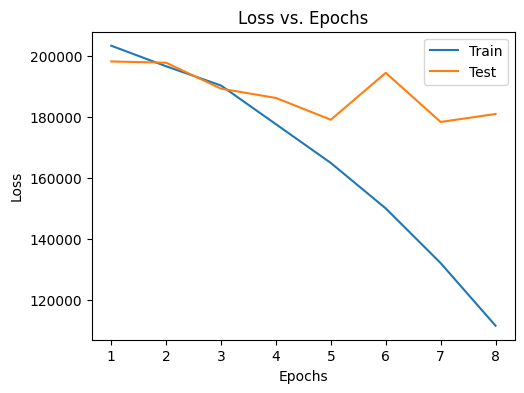

In [7]:
# Initialize loss function,and optimizer
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Initialize lists to store training and testing losses
train_losses = []
test_losses = []

# Load model if a checkpoint exists
try:
  checkpoint = torch.load("/content/drive/MyDrive/DataSets/model_checkpoint.pth")
  model.load_state_dict(checkpoint['model_state_dict'])
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
  train_losses = checkpoint['train_losses']
  test_losses = checkpoint['test_losses']
  start_epoch = checkpoint['epoch'] + 1
  print("Model found and loaded.")
except FileNotFoundError:
  print("No model was found.")
  start_epoch = 0

# Training loop
num_epochs = 8
for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0
    for i, data in enumerate(tqdm(train_loader), 0):
      inputs, labels = data
      inputs, labels = inputs.to(device), labels.to(device) # Using CUDA if possible
      optimizer.zero_grad()
      outputs = model(inputs)
      loss = criterion(outputs, labels) # Calculate loss
      loss.backward()
      optimizer.step()
      running_loss += loss.item()

    train_losses.append(running_loss / len(train_loader))

    # Evaluate on test data
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
      for data in tqdm(test_loader):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item()

    test_losses.append(test_loss / len(test_loader))

    print(f"Epoch {epoch+1}, Train Loss: {train_losses[-1]}, Test Loss: {test_losses[-1]}")

    # Save model, optimizer, and scheduler state after each epoch
    torch.save({
      'epoch': epoch,
      'model_state_dict': model.state_dict(),
      'optimizer_state_dict': optimizer.state_dict(),
      'train_losses': train_losses,
      'test_losses': test_losses,
    }, "/content/drive/MyDrive/DataSets/model_checkpoint.pth")

# Plotting the training and testing loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), train_losses[:8], label='Train')
plt.plot(range(1, num_epochs+1), test_losses[:8], label='Test')
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()



## Conclusion and Next Steps

**We are stopping the model training at this point.** As observed, the test loss continues to decrease slowly, but it is clearly begins to plateau. Whilst the training loss keeps rapidly decreasing. This might indicate that the model is **overfiting** to the data.

Despite that, this initial experiment with a basic CNN model has been **successful** for us. It's important to remember that the primary goal was not to train a fully sufficient model right away, but rather to **verify that the dataset contains enough information for the model to learn**.

























## Visualizing Model Performance

To better understand the performance of our simple CNN model, we will visually compare the actual gaze points with the predicted gaze points. This visual representation will be more intuitive and informative than just looking at loss metrics, which might not be easily interpretable.

We will select a few random samples from the dataset and plot both the real and predicted gaze points on a simulated computer screen. The dimensions of this simulated screen will be 1920x1080 pixels.

By doing this, we aim to provide a **human-readable evaluation** of how well our model is performing in terms of gaze prediction.


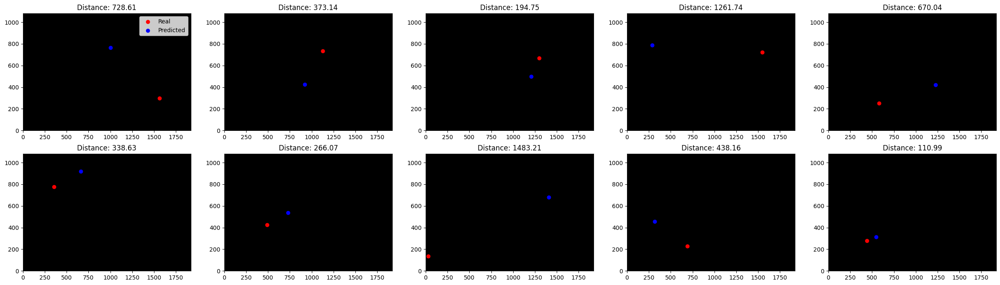

In [8]:
# Ensure the model is in evaluation mode
model.eval()

# Initialize the plot
fig, axes = plt.subplots(2, 5, figsize=(30, 8))
axes = axes.flatten()

# Configure plot appearance to simulate a screen
for ax in axes:
  ax.set_facecolor('black')
  ax.set_xlim([0, 1920])  # Set x-axis limits
  ax.set_ylim([0, 1080])  # Set y-axis limits


# Take 10 images from the test set
for i, (inputs, labels) in enumerate(test_loader):
  if i>=10: break
  # Move inputs and labels to the device of the model
  inputs, labels = inputs.to(device), labels.to(device)

  # Forward pass to get model outputs
  with torch.no_grad():
    outputs = model(inputs)

  # Convert outputs and labels to NumPy arrays
  outputs = outputs.cpu().numpy()
  labels = labels.cpu().numpy()

  # Calculate the distance between the real and predicted points (using euclidean distance)
  distance = np.sqrt(np.sum((labels[0] - outputs[0]) ** 2))

  # Plot the real and predicted coordinates
  ax = axes[i]
  ax.scatter(labels[0, 0], labels[0, 1], color='red', label='Real' if i == 0 else "")
  ax.scatter(outputs[0, 0], outputs[0, 1], color='blue', label='Predicted' if i == 0 else "")
  ax.set_title(f"Distance: {distance:.2f}")

# Add legend to the first subplot
axes[0].legend()

# Show the plot
plt.show()


---

From the visualizations, it is evident that the model has successfully identified certain image features that correlate with gaze direction. However, the accuracy remains suboptimal, and in some instances, the model's predictions deviate **significantly**. Despite these shortcomings, the model generally approximates the gaze direction, although with a considerable margin of error.

Our findings are promising in two key ways: first, the problem at hand is learnable, and second, the images contain features that correlate with gaze points. Armed with this knowledge and an understanding of our limitations, particularly concerning training time and the need for dimensionality reduction,we can proceed to address these challenges.

### **Identified Problems and Solutions**

#### **Problem 1: Dimensionality and Data Preprocessing**  
Given the high dimensionality of the images and the sizable dataset, it is imperative to streamline the data fed into the model.  
**Solution:**  
Our **initial approach** to solving this problem will raise a discussion on exactly what information we want our model to focus on. To understand this better, consider the analogy of a laser pointer: where a laser pointer is aimed in a particular direction, the goal is to predict where the laser dot will appear when the device is activated. In this simplified thought experiment, elements such as the background or the shape of the laser pointer itself are inconsequential. What truly matters is the actual exit point of the laser and its relative position in space.

Applying this principle to our gaze estimation challenge allows us to refine the scope of our problem. Instead of estimating the gaze from the complete image we can narrow our focus to two main features: the eyes and the location of the head within the image. This approach aligns with the core elements that matter in the laser pointer analogy, thereby providing a more targeted and potentially effective method for gaze prediction.


#### **Problem 2: Hardware and Time Constraints**
The utilization of a GPU for training is a difficult resource, both in terms of availability and time. It became evident from the initial model training experiment that the GPU on my local machine is inadequate for training complex models, necessitating the use of a hosted service. Consequently, the project was migrated to Google Colab, which provides a GPU for model training. However, Google Colab has implicit limitations on GPU availability, and at times, it may restrict the user to specific run durations or GPU usage.

**Solution:**
To address this issue, we have devised several solutions.

Firstly, using pretrained networks could expedite the initial phases of training and might facilitate superior feature mapping for our regression head.

Secondly, we discerned that incremental training is imperative, especially given Google Colab's lack of transparency regarding runtime resources. This means there are undisclosed limitations on the duration a user can maintain a runtime running. To avoid losing progress achieved, we have found that saving the training progress after each epoch is the most effective approach. This method mitigates the risk of crashes and enables the training of the model across different sessions, ensuring continuity and efficiency in the training process.


####**Problem 3: Resolution**  
During our manual attempts to predict gaze direction, a realization emerged: perhaps the most crucial features for gaze estimation are condensed into a very small number of pixels—specifically, the eyes. It's possible that the image quality and resolution are far below what's needed for an effective gaze estimation model. This issue is well-known in the field and is a primary reason why infrared cameras are often employed in gaze estimation studies.

However, our objective is to develop a model that functions even with standard webcams. This necessitates exploring non-mechanical methods to enhance the eye region before feeding it into the model. Among the ideas considered are the use of filters to improve eye contrast, thereby aiding the model in capturing the direction in which the eyes are pointed. Additionally, we are contemplating the application of feature extraction techniques to the eye images themselves, aiming to capture variations in their shape as a feature of gaze direction.

### **Next Steps**  
With the problems and potential solutions now clearly outlined, let's turn our attention to the first issue at hand: the presence of redundant information in our images. This not only increases computational time but may also impede the model's learning process. Several strategies have been considered to address this. We propose cropping the eye region from the original images and using the remaining features to encode the head's 3D position relative to the camera.

Even with this refined approach, several considerations arise. For instance, should the eyes be presented together in a single image to be processed by one Convolutional Neural Network (CNN), or should they be separated and each fed into distinct CNNs? This would allow for the extraction of gaze features that are invariant to the specific eye from which they originated. Another consideration involves the encoding of head position. While the initial idea was to simply pass the four corners of a bounding box around the face, this has evolved into a more sophisticated grid mapping representation. In this scheme, a grid of a predetermined size is generated for each image, and the head's relative location within the original image is inscribed onto this grid. This ensures that adequate information about both the position and relative size of the head is retained, which is also indicative of the depth dimension.

At this point, we have opted not to use pretrained models as feature extractors. This decision is made to test our current hypothesis concerning the types of input. Specifically, the eyes and the encoded head location,that are most beneficial for our model. Similarly, we will refrain from any further data modifications at this stage. This is to isolate the impact of input changes on the model's performance. Should we observe an improvement in performance, we will then proceed to explore image enhancement techniques.

---


Given our discussions and considerations, we have determined that our next  step, which is partially inspired by the paper "[Eye Tracking for Everyone" by Kyle Krafka et al](https://arxiv.org/abs/1606.05814)., involves the extraction of images of each eye, the face, and the grid encoding of the facial region separately. Each of these elements will subsequently be utilized in distinct components of our model.
We will further dive into the exact model architecture when we will define it.

The first step in our approach is **Facial Landmark Extraction**.
In the context of our mission we require to extract the location of the eyes together with the coordiantes which correspond to the bounding box of the face.

Following experimentation with various landmark extraction techniques, including **Haar cascades** and **deep learning models**, we have determined that the Python library "**Face_Recognition**" provides the most reliable results. This library stands out not only for its accuracy but also for its ease of use, affording us maximum flexibility for any future modifications.

Therefore, our first step will be to install this library.


In [9]:
pip install face_recognition

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 14.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=ae1fc9b17290aee82e18e34dc9fdcda0a6298354e714b19446b8ee0df0e33690
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


Next, we present a concise overview of the capabilities of the "face_recognition" library. As demonstrated, we can effortlessly extract facial landmarks and the face location in an image with a simple command.

The true strength of this library lies in its ability to **predict** landmarks with precision, even in instances where direct visibility is compromised. As illustrated in the subsequent example, despite the hand obscuring parts of the mouth and the facial border, the library still yields **accurate landmarks** for our utilization.

This feature will be invaluable in later stages when we aim to demonstrate the robustness of our models under regular, unconstrained usage conditions.


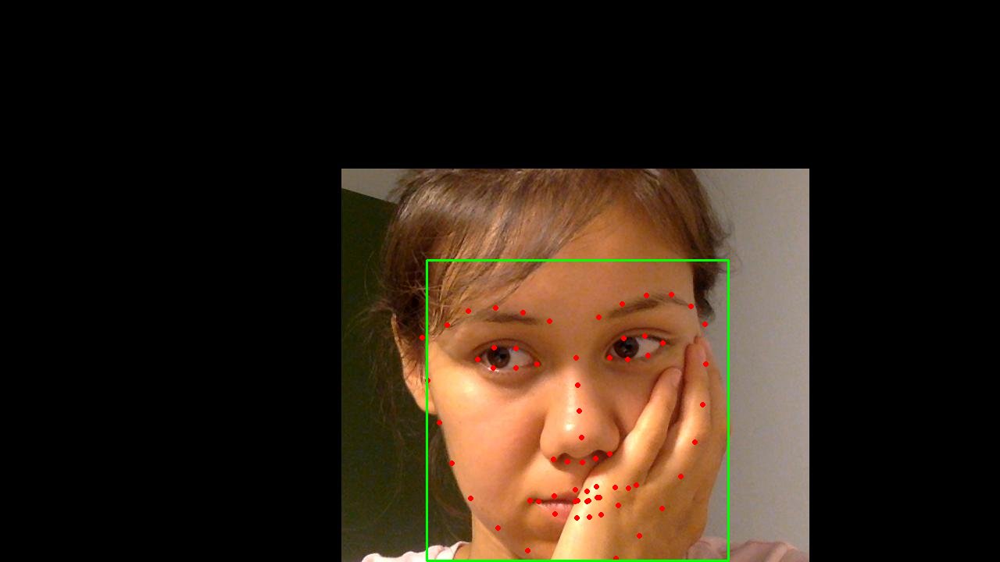

In [10]:
from google.colab.patches import cv2_imshow #Used for image display in google colab
import face_recognition as fr

# Load a sample image
sample_path = corrected_paths[-108] #Hand selected sample with a partial obstruction of the face
img = cv2.imread(sample_path)

# Define colors
landmark_color = (0, 0, 255)  # Red
face_location_color = (0, 255, 0)  # Green

# Extract facial landmarks and face locations
landmarks = fr.face_landmarks(img)[0]
face_location = fr.face_locations(img)[0]

# Draw red circles on facial landmarks
for landmark_type, locations in landmarks.items():
  for location in locations:
    cv2.circle(img, location, 2, landmark_color, 2)

# Draw a green rectangle around the face
top, right, bottom, left = face_location
cv2.rectangle(img, (left, top), (right, bottom), face_location_color, 2)

# Display the image
cv2_imshow(img)


Despite the advanced capabilities and high accuracy of the selected library, we have detected variability in precision, especially with images having very dark or highly obscured facial features. Therefore, our next step involves  sifting through each image in our dataset to ensure accurate feature extraction. This process will be of course automated, however, due to significant CPU usage and the extended duration required, it is not feasible to perform this task comfortably on Google Colab. Consequently, we have decided to run this processing on our local machine. In essence, each image is loaded, facial features are extracted and counted to match the desired outcome, ensuring that all the required facial features are present in the image and are recognizable.

Regarding images that are not recognized properly, we have two viable options: either to annotate these outliers manually or to exclude them from our dataset.

In [11]:
import json
with open('/content/drive/MyDrive/DataSets/WS/new_paths.json', 'r') as f:
  new_paths = json.load(f)

with open('/content/drive/MyDrive/DataSets/WS/new_coords.json', 'r') as f:
  new_coords = json.load(f)

print(f'Original size of dataset: {len(corrected_paths)}, Size after preproessing: {len(new_paths)}, Difference: {len(corrected_paths)-len(new_paths)}')

# We will of course have to adapt the paths to fit our google drive representation:
new_corrected_paths = ['/content/drive/MyDrive/DataSets/MPIIFaceGaze' + new_path[1:].replace("\\", "/") for new_path in new_paths]
new_corrected_paths = [path.replace("MPIIFaceGaze/MPIIFaceGaze", "MPIIFaceGaze") for path in new_corrected_paths]

Original size of dataset: 37416, Size after preproessing: 36473, Difference: 943


We observed that the difference is only 943 images, making the exclusion of these relatively inconsequential. Thus, we have decided to filter out images that the face_recognition library was unable to correctly identify.

Let's briefly review the images that were chosen for removal to possibly identify a common factor:

<img src="https://drive.google.com/uc?export=view&id=1bxNJVTLhi5xgDlb6HSDNj1vhDX8t6mId" alt="Image" style="display: block; margin: auto;"/>

As we can see, the images filtered out were mostly due to loss of information caused by lighting conditions. For instance, in images 1 and 3, the visibility of the eyes is notably low, and even applying contrast filters may not effectively enhance the data extraction. Additionally, image 2 exhibits significant noise combined with poor visibility due to inadequate lighting. Thus, we concluded that these images are better to be filtered out, rather then incorrectly represent the feature space we would like the models to learn from.

Our aim is not to create a model that can perfectly assess gaze points in low lighting or poor-quality conditions. Instead, we prefer to refine a model that operates optimally under standard conditions, which, as previously highlighted, includes an assumption of the average user, including normal lighting conditions.



Having identified the viable images, we encountered another processing issue. Originally, we assigned the dataset object the task of performing most of the operations including facial feature recognition, extraction, cropping, and encoding of facial location. This approach, however, introduced a significant bottleneck during model training. To address this, we modified our strategy to execute the entire preprocessing pipeline separately, storing the results extracted from each image in an H5Py file. This file will then be loaded into the dataset for subsequent utilization.

In [12]:
import h5py

def crop_region(img, region_center, radius):
    height, width, _ = img.shape
    center_x, center_y = int(region_center[0]), int(region_center[1])

    left = center_x - radius
    right = center_x + radius
    top = center_y - radius
    bottom = center_y + radius
    # We check that the crop bounderis are inside the image boundries
    if left < 0:
      right += abs(left)
      left = 0
    if right > width:
      left -= (right - width)
      right = width
    if top < 0:
      bottom += abs(top)
      top = 0
    if bottom > height:
      top -= (bottom - height)
      bottom = height

    cropped_region = img[top:bottom, left:right]
    return cropped_region

def create_face_grid(img, face_location):
    top, right, bottom, left = face_location
    # We will use a 25x25 grid to represent the facial location on the image
    grid = np.zeros((25, 25), dtype=np.float32)
    x_scale = 25 / img.shape[1]
    y_scale = 25 / img.shape[0]
    grid[int(top * y_scale):int(bottom * y_scale), int(left * x_scale):int(right * x_scale)] = 1
    return torch.tensor(grid, dtype=torch.float32)


def preprocess_and_save(image_paths, coordinates, hdf5_file, start_idx=0):
  first_run = True  # We display the first image every run, making sure the results and ratios are as required.

  with h5py.File(hdf5_file, "a") as f:
    if start_idx >= len(image_paths):
      print(f"Start index {start_idx} is out of range.")
      return

    try:
      for idx in tqdm(range(start_idx, len(image_paths))):
        img_path =  image_paths[idx]
        img = cv2.imread(img_path)

        if img is None:
          print(f"Image not found at {img_path} number {idx}")
          continue

        face_landmarks_list = fr.face_landmarks(img) # Detect facial features

        if not face_landmarks_list: # This should no longer be an issue after the previous preprocessing step
          print(f"No face found in {img_path} number {idx}")
          continue

        face_landmarks = face_landmarks_list[0]
        left_eye = np.array(face_landmarks['left_eye'])
        right_eye = np.array(face_landmarks['right_eye'])
        left_eye_center = np.mean(left_eye, axis=0)
        right_eye_center = np.mean(right_eye, axis=0)

        face_locations = fr.face_locations(img)[0] # Detecting the facial bounding box
        face_center = ((face_locations[1] + face_locations[3]) // 2, (face_locations[0] + face_locations[2]) // 2)

        left_eye_img = crop_region(img, left_eye_center, 64)
        right_eye_img = crop_region(img, right_eye_center, 64)
        face_img = crop_region(img, face_center, 128)

        # Fail-safe to check for size inconsistencies.
        if left_eye_img.shape[:2] != (128, 128) or right_eye_img.shape[:2] != (128, 128) or face_img.shape[:2] != (256, 256):
          print(f"Size inconsistency at {img_path} number {idx}: left_eye: {left_eye_img.shape}, right_eye: {right_eye_img.shape}, face: {face_img.shape}")
          return  # Stop the preprocessing other wise might introduce buggy data into the dataset crashing our training

        face_grid = create_face_grid(img, face_locations)

        # We transform the color scheme to RGB for easier ploting with matplotlib
        left_eye_img = cv2.cvtColor(left_eye_img, cv2.COLOR_BGR2RGB)
        right_eye_img = cv2.cvtColor(right_eye_img, cv2.COLOR_BGR2RGB)
        face_img = cv2.cvtColor(face_img, cv2.COLOR_BGR2RGB)
        # Since the images are loaded with the channel dimension last we transpose it into a format that pytorch expects (C,H,W)
        left_eye_img = np.transpose(left_eye_img, (2, 0, 1))
        right_eye_img = np.transpose(right_eye_img, (2, 0, 1))
        face_img = np.transpose(face_img, (2, 0, 1))

        #Set the resolution
        screen_width = 1920
        screen_height = 1080
        integer_coordinates = coordinates[idx]
        normalized_coords = [integer_coordinates[0] / screen_width, integer_coordinates[1] / screen_height] # We also normalize the coordinates as this seems to improve the training accuracy according to the paper


        grp = f.create_group(str(idx))
        grp.create_dataset("left_eye", data=left_eye_img, compression="gzip", compression_opts=9)
        grp.create_dataset("right_eye", data=right_eye_img, compression="gzip", compression_opts=9)
        grp.create_dataset("face", data=face_img, compression="gzip", compression_opts=9)
        grp.create_dataset("face_grid", data=face_grid, compression="gzip", compression_opts=9)
        grp.create_dataset("coords", data=normalized_coords, compression="gzip", compression_opts=9)

        if first_run:  # Display a sample for every run
          plt.figure(figsize=(12, 4))
          plt.subplot(1, 4, 1)
          plt.imshow(np.transpose(left_eye_img, (1, 2, 0))) #Notice the need to transpose back to the matlplotlib format where the channel is last
          plt.title('Left Eye')
          plt.axis('off')

          plt.subplot(1, 4, 2)
          plt.imshow(np.transpose(right_eye_img, (1, 2, 0)))
          plt.title('Right Eye')
          plt.axis('off')

          plt.subplot(1, 4, 3)
          plt.imshow(np.transpose(face_img, (1, 2, 0)))
          plt.title('Face')
          plt.axis('off')

          plt.subplot(1, 4, 4)
          plt.imshow(face_grid, cmap='gray')
          plt.title('Face Grid')
          plt.axis('off')

          plt.show()
          first_run = False  # Set it to False after displaying the first sample
        #Save the data
        with open('last_processed_idx.txt', 'w') as idx_file:
          idx_file.write(str(idx))

    except KeyboardInterrupt: #Due to the length of time to run this code, we had to run it across multiple seassion, thus interrupts were expected
      print("KeyboardInterrupt detected. Saving last processed index")
      with open('last_processed_idx.txt', 'w') as idx_file:
        idx_file.write(str(idx))


image_paths = new_corrected_paths
coordinates = new_coords
hdf5_file = '/content/drive/MyDrive/DataSets/WS/preprocessed_data4.hdf5'


if os.path.exists('last_processed_idx.txt'):
  with open('last_processed_idx.txt', 'r') as idx_file:
    start_idx = int(idx_file.read().strip()) + 1  # Start from the next index
else:
  start_idx = 0


# The following was used during different runs of the code for debugging and corruption checking
try:
  with h5py.File(hdf5_file, "r") as f:
    print("File can be opened. It contains the following number of groups:")
    print(len(list(f.keys())))
except Exception as e:
    print(f"File cannot be opened due to the following error:\n{e}")

# We commented the call since it has already finished running
#preprocess_and_save(image_paths, coordinates, hdf5_file, start_idx=start_idx)

File can be opened. It contains the following number of groups:
36471


After completing the extensive preprocessing steps, we are now prepared to construct our dataset and model and to start the training process.

In [13]:
class NewGazeDataset(Dataset):
  def __init__(self, file_path):
    self.file_path = file_path
    with h5py.File(file_path, 'r') as f:
      # Only considering groups, ensuring all considered elements have the expected datasets.
      self.keys = [key for key in f.keys() if isinstance(f[key], h5py.Group) and all(ds in f[key] for ds in ['left_eye', 'right_eye', 'face', 'face_grid', 'coords'])]
    self.length = len(self.keys)

  def __len__(self):
    return self.length

  def __getitem__(self, index):
    with h5py.File(self.file_path, 'r') as f:
      # Getting the group using the key from the list of keys.
      # This approach will both minimize memory usage, and is less prone to errors
      group = f[self.keys[index]]
      left_eye = torch.tensor(group['left_eye'][:], dtype=torch.float32) / 255.0
      right_eye = torch.tensor(group['right_eye'][:], dtype=torch.float32) / 255.0
      face = torch.tensor(group['face'][:], dtype=torch.float32) / 255.0
      face_grid = torch.tensor(group['face_grid'][:], dtype=torch.float32)
      coords = torch.tensor(group['coords'][:], dtype=torch.float32)
    return {
        'left_eye': left_eye,
        'right_eye': right_eye,
        'face': face,
        'face_grid': face_grid,
        'coords': coords
    }

# Initialize DataSet
gaze_dataset = NewGazeDataset('/content/drive/MyDrive/DataSets/WS/preprocessed_data4.hdf5')
print(len(gaze_dataset)) #Checking the size of our dataset


36471


Let us review the result of this dataset and all of our preprocessing.

Shape of left_eye: torch.Size([3, 128, 128])
Shape of right_eye: torch.Size([3, 128, 128])
Shape of face: torch.Size([3, 256, 256])
Shape of face_grid: torch.Size([25, 25])
Shape of coords: torch.Size([2])


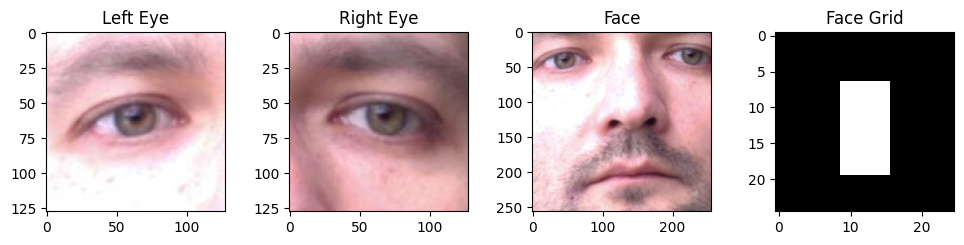

In [14]:
sample = gaze_dataset[-1]
if sample:
  for elem in sample:
    print(f'Shape of {elem}: {sample[elem].shape}')

  fig, axs = plt.subplots(1, 4, figsize=(10, 5))

  # Displaying the left eye image
  axs[0].imshow(np.transpose(sample['left_eye'].numpy(), (1, 2, 0)) )
  axs[0].set_title('Left Eye')

  # Displaying the right eye image
  axs[1].imshow(np.transpose(sample['right_eye'].numpy(), (1, 2, 0)) )
  axs[1].set_title('Right Eye')

  # Displaying the face image
  axs[2].imshow(np.transpose(sample['face'].numpy(), (1, 2, 0)) )
  axs[2].set_title('Face')

  # Displaying the face grid
  axs[3].imshow(sample['face_grid'].numpy(), cmap='gray')
  axs[3].set_title('Face Grid')

  plt.tight_layout(pad=2.0)
  plt.show()


As we can see all our preprocessing steps have been successfully executed. Our dataset is composed of images of the left and right eyes, each of size 128x128, along with a cropped face image of size 256x256, and a face grid which represents the relative position of the face in the original image.

It is important to note that the image sizes we selected are not arbitrary, they have been selected in accordance to our hardware limitations. Larger images would necessitate excessive computational time, whilst smaller images risk loss of information. Therefore, through trial and error, we have arrived at the sizes present above.

Now armed with the new dataset we can focus on creating our model architecture.
We hope to produce a model whose different segments are able to focus on different aspects of the data. This strategy allows one convolutional network to specialize in extracting gaze-oriented features from the eye images, while another concentrates on deriving facial features from the face image that are associated with the gaze point. Meanwhile, a fully connected network interprets positional information from the face grid.

After the feature mapping, each of these elements will be concatenated and passed to a regression head, which is tasked with translating the diverse feature mappings into a decision.

Next we will split the dataset into training and testing

In [15]:
# Similarly to before we define the train ratio as 0.8
train_size = int(TRAIN_RATIO * len(gaze_dataset))
test_size = len(gaze_dataset) - train_size
train_dataset, test_dataset = random_split(gaze_dataset, [train_size, test_size], generator=torch.Generator().manual_seed(SEED))

Now, let's delve into the model definition. After consideration of various model architectures and a review of numerous papers on the topic, each presenting a unique approach to the problem at hand, we have reached a conclusion. It's important to note that we are still grappling with hardware limitations and GPU computation time. Consequently, we opted for a model that aligns with the one used in the paper previously mentioned, authored by Krafka et al.

This choice is driven by both the simplicity of the model, and its proven compatability with the data preprocessing we have already conducted.

In [16]:
class BasicImageModel(nn.Module): #Used as the basic unit in the complete model
  def __init__(self, input_channels=3):
    super(BasicImageModel, self).__init__()
    self.features = nn.Sequential(
      nn.Conv2d(input_channels, 96, kernel_size=11, stride=4, padding=0),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=3, stride=2),
      nn.BatchNorm2d(96),
      nn.Conv2d(96, 256, kernel_size=5, stride=1, padding=2, groups=2),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=3, stride=2),
      nn.BatchNorm2d(256),
      nn.Conv2d(256, 384, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(384, 64, kernel_size=1, stride=1, padding=0),
      nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = self.features(x)
    x = x.view(x.size(0), -1)
    return x

class FaceImageModel(nn.Module):
  def __init__(self, input_channels):
    super(FaceImageModel, self).__init__()
    self.conv = BasicImageModel(input_channels) #Note the use of the basic unit mentioned above
    self.fc = nn.Sequential(
      nn.Linear(12544, 128),  # Adjusted based on the input image size
      nn.ReLU(inplace=True),
      nn.Linear(128, 64),
      nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = self.conv(x)
    x = self.fc(x)
    return x

class FaceGridModel(nn.Module):
  # Basic model sufficiant for the low dimensionality of the grid
  def __init__(self, gridSize=25):
    super(FaceGridModel, self).__init__()
    self.fc = nn.Sequential(
      nn.Linear(gridSize * gridSize, 256),
      nn.ReLU(inplace=True),
      nn.Linear(256, 128),
      nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = x.view(x.size(0), -1)
    x = self.fc(x)
    return x

class CombinedModel(nn.Module):
  def __init__(self):
    super(CombinedModel, self).__init__()
    self.eyeModel = BasicImageModel(input_channels=3)
    self.faceModel = FaceImageModel(input_channels=3)
    self.gridModel = FaceGridModel()
    self.eyesFC = nn.Sequential(
      nn.Linear(4608, 128),
      nn.ReLU(inplace=True),
    )
    self.fc = nn.Sequential(
      nn.Linear(128+64+128, 128),
      nn.ReLU(inplace=True),
      nn.Linear(128, 2),
    )

  def forward(self, left_eye, right_eye, face, face_grid):
    #Notice we feed both images into the same instance of the eye model this results in shared weights between the processing of both eyes
    EyeL = self.eyeModel(left_eye)
    EyeR = self.eyeModel(right_eye)
    Eyes = torch.cat((EyeL, EyeR), 1)
    Eyes = self.eyesFC(Eyes)

    Face = self.faceModel(face)
    Grid = self.gridModel(face_grid)

    x = torch.cat((Eyes, Face, Grid), 1)
    x = self.fc(x)
    return x

# Initialize the model and move it to the device
model = CombinedModel().to(device)
print(f"Model initialized on {device}")

Model initialized on cuda:0


With the model now loaded and prepared, it's time to establish our training loop. As with prior attempts, we continue to face challenges with long training times. To address this, we have implemented the same model saving and loading that we used previously. This not only allows training across multiple sessions but also provides resilience against unexpected crashes.

Model found and loaded.


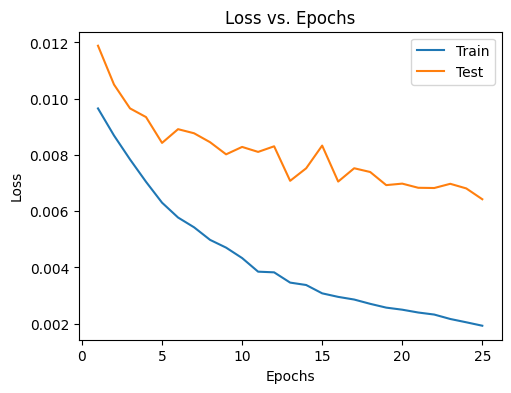

In [17]:
def load_checkpoint(model, optimizer, checkpoint_path):
  try:
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    print("Model found and loaded.")
    return checkpoint['train_losses'], checkpoint['test_losses'], checkpoint['epoch'] + 1

  except FileNotFoundError: #If first iteration on this model and no save exists yet
    print("No model was found.")
    return [], [], 0


def save_checkpoint(epoch, model, optimizer, train_losses, test_losses, checkpoint_path):
  torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_losses': train_losses,
    'test_losses': test_losses,
  }, checkpoint_path)


def plot_losses(train_losses, test_losses):
  plt.figure(figsize=(12, 4))
  plt.subplot(1, 2, 1)
  plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train')
  plt.plot(range(1, len(test_losses) + 1), test_losses, label='Test')
  plt.title('Loss vs. Epochs')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()


# Initialize loss function and optimizer
criterion = torch.nn.MSELoss()
initial_lr = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=initial_lr)

# Initialize DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=1) #during training set to 2 workers
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0)

# Load checkpoint
checkpoint_path = "/content/drive/MyDrive/DataSets/Combined_model_checkpoint5.pth"
train_losses, test_losses, start_epoch = load_checkpoint(model, optimizer, checkpoint_path)

def train():
  num_epochs = 30 # Note the incerease in epoch
  for epoch in range(start_epoch, num_epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0
    # Step
    for i, data in enumerate(tqdm(train_loader), 0):
      # Preparing inputs and target
      left_eye = data['left_eye'].to(device)
      right_eye = data['right_eye'].to(device)
      face = data['face'].to(device)
      face_grid = data['face_grid'].to(device)
      coords = data['coords'].to(device)
      # Forward pass
      outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)
      loss = criterion(outputs, coords)

      # Backward and optimize
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item()

    # Calculating average training loss for the epoch
    train_losses.append(running_loss / len(train_loader))

    # Evaluation step
    model.eval()  # Set the model to evaluation mode
    test_loss = 0.0
    with torch.no_grad():  # Disable gradient computation during evaluation
      for data in tqdm(test_loader):
        left_eye = data['left_eye'].to(device)
        right_eye = data['right_eye'].to(device)
        face = data['face'].to(device)
        face_grid = data['face_grid'].to(device)
        coords = data['coords'].to(device)

        outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)
        loss = criterion(outputs, coords)
        test_loss += loss.item()

    # Calculating average testing loss for the epoch
    test_losses.append(test_loss / len(test_loader))

    print(f"Epoch {epoch + 1}, Train Loss: {train_losses[-1]}, Test Loss: {test_losses[-1]}")

    # Save checkpoint
    save_checkpoint(epoch, model, optimizer, train_losses, test_losses, checkpoint_path)

  # Plot losses
  plot_losses(train_losses[5:30], test_losses[5:30])

# Run the training
train()



From the results, it's evident that the model performance has improved significantly. Continuing our prior approach, we'll visualize the accuracy of our model using 10 random test samples, plotting them on a simulated computer screen with the correct aspect ratio. This method offers a more human comprehensible understanding of our model's performance, compared to solely relying on abstract loss figures.

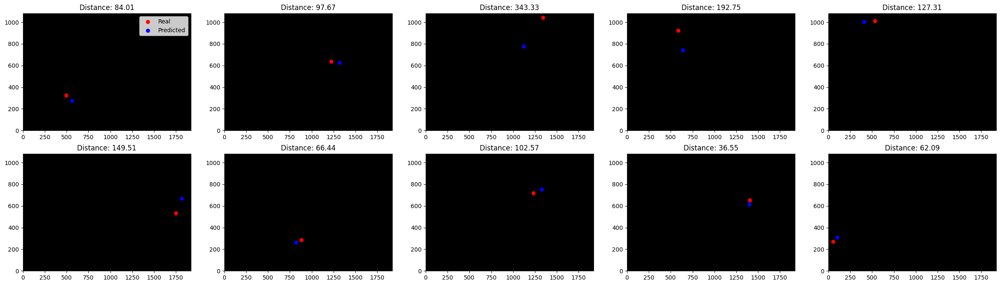

In [18]:
model.eval()

# Initialize the plot
fig, axes = plt.subplots(2, 5, figsize=(30, 8))
axes = axes.flatten()

# Configure plot appearance to simulate a screen
for ax in axes:
  ax.set_facecolor('black')
  ax.set_xlim([0, 1920])  # Set x-axis limits
  ax.set_ylim([0, 1080])  # Set y-axis limits

# Get 10 unique random sample indices
random_samples = random.sample(range(len(test_dataset)), 10)

for i, idx in enumerate(random_samples):
  data = test_dataset[idx]

  # Prepare the inputs
  left_eye = data['left_eye'].unsqueeze(0).to(device)
  right_eye = data['right_eye'].unsqueeze(0).to(device)
  face = data['face'].unsqueeze(0).to(device)
  face_grid = data['face_grid'].unsqueeze(0).to(device)
  coords = data['coords'].unsqueeze(0).to(device)


  # Forward pass to get model outputs
  with torch.no_grad():
    outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)

  # Convert outputs and labels to NumPy arrays for ploting (notice we scale them back after normalization)
  outputs = outputs.cpu().numpy() * np.array([1920, 1080])
  coords = coords.cpu().numpy() * np.array([1920, 1080])

  # Calculate the distance between the real and predicted points (using Euclidean distance)
  distance = np.sqrt(np.sum((coords[0] - outputs[0]) ** 2))

  # Find the corresponding axis
  ax = axes[i]
  ax.scatter(coords[0, 0], coords[0, 1], color='red', label='Real' if i == 0 else "")
  ax.scatter(outputs[0, 0], outputs[0, 1], color='blue', label='Predicted' if i == 0 else "")
  ax.set_title(f"Distance: {distance:.2f}")

# Add legend to the first subplot
axes[0].legend()
plt.show()


We have observed a significant improvement in accuracy with our new model.

Several factors contribute to this improvement:

1. **Enhanced Training with Refined Data**: Compared to the basic model we initially employed, this model, trained on lower dimensional data, could undergo more epochs and utilize a larger batch size without exhausting the RAM. This extended training likely facilitated a more comprehensive representation of the data space.
2. **Validation of Initial Hypothesis**: Our initial hypothesis suggested that the original model might have faced challenges in effectively extracting gaze-correlated features from raw, unprocessed images. The new model has access to hand crafted features with the highest probability of being linked to gaze, has the majority of its work already done for it.

To further analyze the performance of our model and gain deeper insights into its operational mechanics, we have elected to employ a well-known tool, Captum. Captum is a model interpretability library specifically designed for PyTorch. It offers tools that assist in visualizing and deciphering the crucial features of input data that significantly influence the model's predictions.

Our next step involves installing Captum into our environment.












In [19]:
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 11.0 MB/s eta 0:00:00



Next, we plan to apply Captum to our model using a randomly selected test sample. Captum is adept at processing individual input samples and generating a visual representation of the interactions between the input and the model. This visualization highlights the specific aspects of the input that most significantly influence the model's output.

<Figure size 600x600 with 0 Axes>

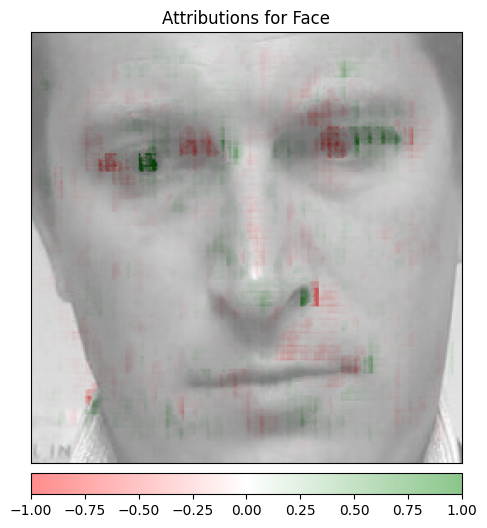

In [20]:
from captum.attr import IntegratedGradients
from captum.attr import visualization as viz

# Get a single batch of data from the test set
dataiter = iter(test_loader)
data = next(dataiter)

# Extract the first sample from the batch
left_eye_single = data['left_eye'][0].unsqueeze(0).to(device)
right_eye_single = data['right_eye'][0].unsqueeze(0).to(device)
face_single = data['face'][0].unsqueeze(0).to(device)
face_grid_single = data['face_grid'][0].unsqueeze(0).to(device)

# Adjusted forward function to the format captum expects
def forward_func_face(face, left_eye, right_eye, face_grid):
  # Forward pass through the model with adjusted input order
  return model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)

# Compute attributions for the face input
integrated_gradients_face = IntegratedGradients(forward_func_face)
attributions_ig_face = integrated_gradients_face.attribute(face_single, target=0, additional_forward_args=(left_eye_single, right_eye_single, face_grid_single))
# Prepare for visualization
attr_ig_np_face = attributions_ig_face[0].cpu().permute(1, 2, 0).detach().numpy()
original_image_np_face = face_single[0].cpu().permute(1, 2, 0).detach().numpy()

# Visualize the attributions
plt.figure(figsize=(6, 6))
viz.visualize_image_attr(attr_ig_np_face, original_image_np_face, method="blended_heat_map", sign="all", show_colorbar=True, title="Attributions for Face", alpha_overlay=0.45)
plt.show()


As we can see from the image above, we have applied an overlay representing the importance of different parts of the image on top of the source image.
Since as we remember our model takes a varied input namely both the eyes cropped out, the face, and a grid encoding of the position of the face. we can see that the activation level for each of the areas is relativly small, this is probably due to the fact that the facial image is only a part of the total input. additionally we can see that the heighest level of activation occures around the eyes, which follows as expected. lastly regarding the coloration of the different activated areas, we can see that the green areas have a positive corolartion to the output whilst the red have negative corrolartion, of course both parts are integral for the model to learn, we can think of it as the model looking at both regions, and while the green represents parts of the model which positivly effect the output, the red affect it negativly, lastly the grey areas have low level of activation, meaning that our model doesnt care too much about whats going on in these parts of the image.

after reviewing the facial image, let us also take note of the activation of the other parts of the input, namely the eyes themselves.

<Figure size 600x600 with 0 Axes>

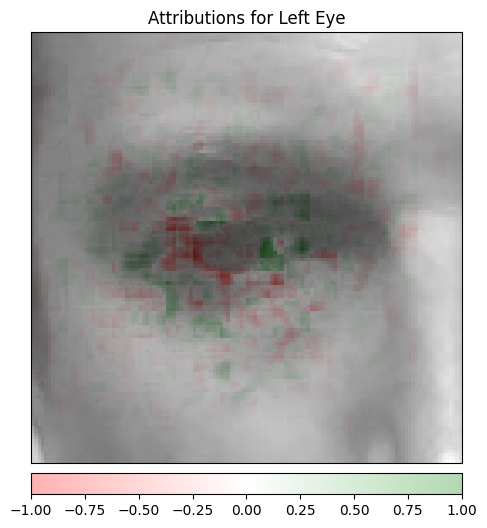

<Figure size 600x600 with 0 Axes>

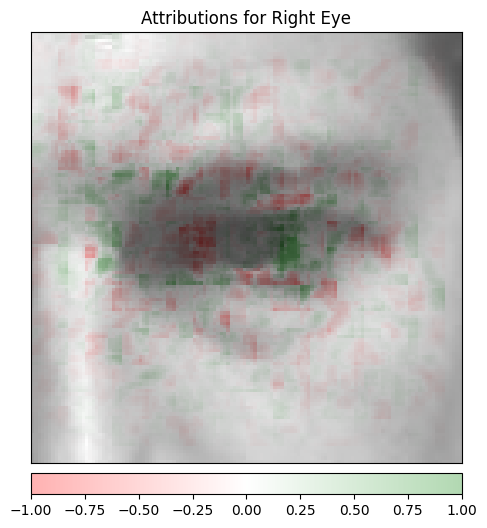

In [21]:
# Define a new forward function for the eyes
def forward_func_combined(left_eye, right_eye, face, face_grid):
  return model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)

# Compute attributions using Integrated Gradients for the left and right eyes
integrated_gradients = IntegratedGradients(forward_func_combined)
attributions_ig_left_eye = integrated_gradients.attribute(left_eye_single, target=0, additional_forward_args=(right_eye_single, face_single, face_grid_single))
attributions_ig_right_eye = integrated_gradients.attribute(right_eye_single, target=0, additional_forward_args=(left_eye_single, face_single, face_grid_single))

# Convert to numpy
attr_ig_np_left_eye = attributions_ig_left_eye[0].cpu().permute(1, 2, 0).detach().numpy()
original_image_np_left_eye = left_eye_single[0].cpu().permute(1, 2, 0).detach().numpy()
attr_ig_np_right_eye = attributions_ig_right_eye[0].cpu().permute(1, 2, 0).detach().numpy()
original_image_np_right_eye = right_eye_single[0].cpu().permute(1, 2, 0).detach().numpy()

# Visualize left eye
plt.figure(figsize=(6, 6))
viz.visualize_image_attr(attr_ig_np_left_eye, original_image_np_left_eye, method="blended_heat_map", sign="all", show_colorbar=True, title="Attributions for Left Eye", alpha_overlay=0.3)
plt.show()

# Visualize right eye
plt.figure(figsize=(6, 6))
viz.visualize_image_attr(attr_ig_np_right_eye, original_image_np_right_eye, method="blended_heat_map", sign="all", show_colorbar=True, title="Attributions for Right Eye", alpha_overlay=0.3)
plt.show()


We observed the highest activation level around the eyes in our model, aligning with our expectations. Notably, it appears that the model focuses more on the sclera (the white part of the eye surrounding the pupil) rather than the pupil itself. Upon careful consideration, we arrived at an intriguing conclusion: in both eye samples, one side of the pupil is marked red while the other side is green. This suggests that the model translates the relative size of the sclera into its feature mapping.

This inference is logical, considering that while the pupil's location may vary, its size remains relatively constant. In contrast, the sclera's size on each side of the pupil correlates directly with the pupil's position. For instance, if the pupil is oriented more to the left, the left side of the sclera will appear smaller. Essentially, this might simplify the model's task of determining the pupil's location to assessing the sclera's size on either side.

This conclusion is quite fascinating, as it hints at potential avenues for improving our model and data. Specifically, to enhance the accuracy of models similar to ours, providing images with higher resolution and clarity could be crucial. Sharper images would enable the model to more easily discern the borders of the sclera, thereby accurately assessing its relative size in the image.



---







This training phase primarily serves as a proof of concept, demonstrating that enhanced feature representation and data processing can indeed elevate model performance. We executed this in isolation from other techniques to test this hypothesis, which has now been validated.

Moving forward, we plan to:

* **Enhance Data Quality**: While retaining the core idea of segmenting data into eyes, head, and head location, we aim to enhance image clarity, especially around the eye region, by applying contrast filters.
* **Leverage Pretrained Networks**: We will explore early feature extraction from images using a pretrained network, potentially expediting and optimizing the training of subsequent layers.



---



We will begin our efforts by focusing on enhancing the data. It is known that excessive preprocessing may negatively impact the quality of our data. Specifically, each preprocessing step can potentially distance our images from real-world scenarios, potentially introducing inherent biases that are not fully understood by us yet. Consequently, this endeavor serves not only to enhance the accuracy of our models but also to assess the validity of additional preprocessing efforts.

Our previous observations indicated that a significant aspect of our model's decision-making process was influenced by the size of the sclera (the white part of the eye surrounding the pupil). In light of this, we have explored various filters and techniques aimed at enhancing the visibility of the sclera. This exploration has led us to two distinct methods:

### **Unsharp Masking**
Unsharp Masking is an image sharpening technique that accentuates edges in an image to make them more pronounced. This method is particularly effective for highlighting fine details. Applying Unsharp Masking may increase the distinguishability of the sclera, potentially improving our model’s accuracy in gaze prediction and enhancing its resilience against image noise caused by imperfect lighting or motion blur.

The Unsharp Masking process involves:
1. Blurring a copy of the original image using a Gaussian filter.
2. Subtracting the blurred image from the original to create a mask that highlights details.
3. Adding this mask back to the original image to enhance its edges and details.

### **CLAHE (Contrast Limited Adaptive Histogram Equalization)**
CLAHE is a sophisticated image processing technique that enhances image contrast. It extends the standard Histogram Equalization approach, which adjusts image intensities to improve contrast.

#### Histogram Equalization
Histogram Equalization redistributes the pixel values of an image, leading to a more uniformly distributed histogram across all intensities. This global adjustment can notably enhance contrast, especially in images that are overly dark or bright.

#### CLAHE
Unlike Histogram Equalization, which uniformly adjusts the entire image, CLAHE divides the image into contextual regions or 'tiles' and applies histogram equalization to each tile separately. This localized approach allows for more nuanced contrast enhancements.

A distinctive feature of CLAHE is its contrast limiting procedure. Post-equalization, any histogram bin exceeding a specified limit has its pixels clipped and uniformly distributed to other bins. This step mitigates the issue of noise amplification, a common problem in standard histogram equalization, particularly in uniform areas.

Implementing CLAHE might introduce more controlled preprocessing to our images, as over-processing can also induce noise and bias, thereby deviating the input image significantly from real-world scenarios.


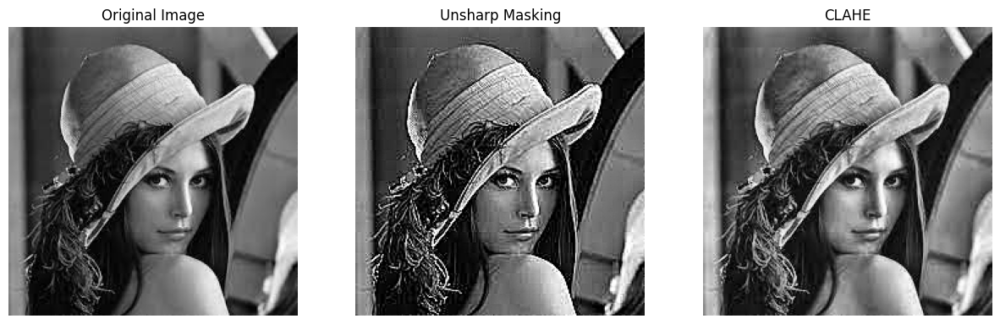

In [22]:
# Load a sample image
image_path = '/content/drive/MyDrive/DataSets/WS/Lena.jpg'
original_image = cv2.imread(image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Following implementation has been taken from an online source
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    if len(image.shape) == 3 and image.shape[2] == 3:  # Check if image is RGB
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)  # Convert to LAB color space
        l, a, b = cv2.split(lab)  # Split into channels
        l = clahe.apply(l.astype(np.uint8))  # Convert L channel to 8-bit and apply CLAHE
        lab = cv2.merge((l, a, b))  # Merge channels
        return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)  # Convert back to RGB
    else:
        return clahe.apply(image.astype(np.uint8))  # Convert to 8-bit if grayscale

def apply_unsharp_masking(image, strength=2.5, radius=1):
    blurred = cv2.GaussianBlur(image, (0, 0), radius)
    return cv2.addWeighted(image, 1 + strength, blurred, -strength, 0)


# Apply Unsharp Masking and CLAHE
unsharp_image = apply_unsharp_masking(original_image)
clahe_image = apply_clahe(original_image)

# Display the original and processed images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(unsharp_image)
plt.title('Unsharp Masking')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(clahe_image)
plt.title('CLAHE')
plt.axis('off')

plt.show()


The determination of which method is superior remains unclear. Therefore, will examine the actual data that will be directly affected by these filters.


32367


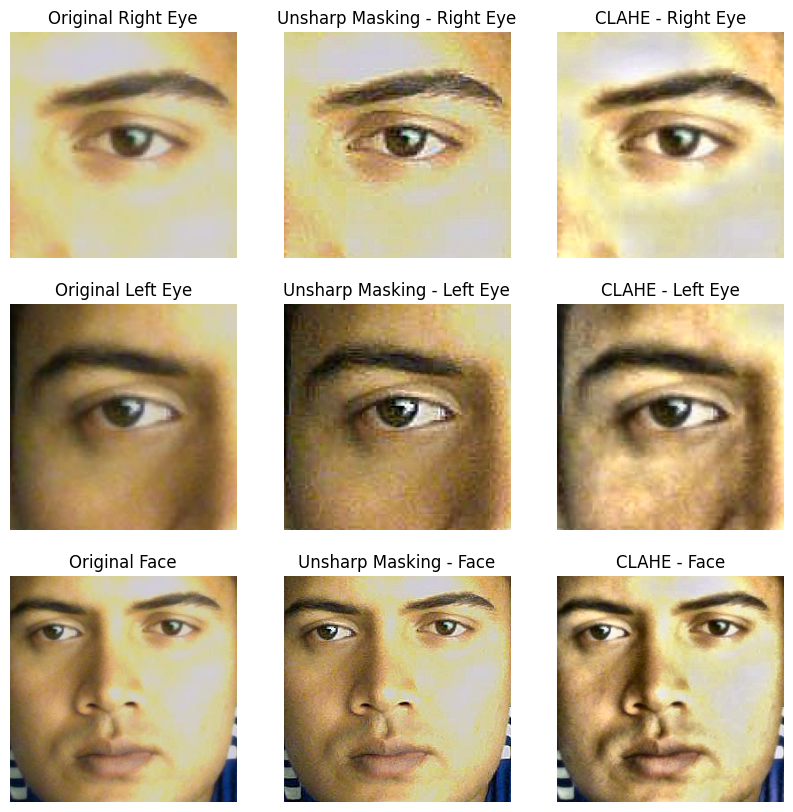

In [23]:
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    if len(image.shape) == 3 and image.shape[2] == 3:  # Check if image is RGB
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)  # Convert to LAB color space
        l, a, b = cv2.split(lab)  # Split into channels
        l = clahe.apply(l.astype(np.uint8))  # Convert L channel to 8-bit and apply CLAHE
        lab = cv2.merge((l, a, b))  # Merge channels
        return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)  # Convert back to RGB
    else:
        return clahe.apply(image.astype(np.uint8))  # Convert to 8-bit if grayscale

def apply_unsharp_masking(image, strength=2.5, radius=1):
    blurred = cv2.GaussianBlur(image, (0, 0), radius)
    return cv2.addWeighted(image, 1 + strength, blurred, -strength, 0)

# Take a random sample from the dataset
random_index = random.randint(0, len(gaze_dataset) - 1)
print(random_index)
sample_data = gaze_dataset[random_index]
sample_r = sample_data['right_eye']
sample_l = sample_data['left_eye']
sample_face = sample_data['face']

# Convert the tensor to a NumPy array and scale to 0-255
right_eye_sample = np.array(sample_r.permute(1, 2, 0) * 255).astype(np.uint8)
left_eye_sample = np.array(sample_l.permute(1, 2, 0) * 255).astype(np.uint8)
face_sample = np.array(sample_face.permute(1, 2, 0) * 255).astype(np.uint8)

# Apply Unsharp Masking and CLAHE
unsharp_right = apply_unsharp_masking(right_eye_sample)
clahe_right = apply_clahe(right_eye_sample)
unsharp_left = apply_unsharp_masking(left_eye_sample)
clahe_left = apply_clahe(left_eye_sample)
unsharp_face = apply_unsharp_masking(face_sample)
clahe_face = apply_clahe(face_sample)

# Display the original and processed images
plt.figure(figsize=(10, 10))

# Display Right Eye Images
plt.subplot(3, 3, 1)
plt.imshow(right_eye_sample)
plt.title('Original Right Eye')
plt.axis('off')

plt.subplot(3, 3, 2)
plt.imshow(unsharp_right)
plt.title('Unsharp Masking - Right Eye')
plt.axis('off')

plt.subplot(3, 3, 3)
plt.imshow(clahe_right)
plt.title('CLAHE - Right Eye')
plt.axis('off')

# Display Left Eye Images
plt.subplot(3, 3, 4)
plt.imshow(left_eye_sample)
plt.title('Original Left Eye')
plt.axis('off')

plt.subplot(3, 3, 5)
plt.imshow(unsharp_left)
plt.title('Unsharp Masking - Left Eye')
plt.axis('off')

plt.subplot(3, 3, 6)
plt.imshow(clahe_left)
plt.title('CLAHE - Left Eye')
plt.axis('off')

# Display Face Images
plt.subplot(3, 3, 7)
plt.imshow(face_sample)
plt.title('Original Face')
plt.axis('off')

plt.subplot(3, 3, 8)
plt.imshow(unsharp_face)
plt.title('Unsharp Masking - Face')
plt.axis('off')

plt.subplot(3, 3, 9)
plt.imshow(clahe_face)
plt.title('CLAHE - Face')
plt.axis('off')

plt.show()


It is now somewhat more evident that the use of CLAHE enhances the finer details around the eyes, leading to a more distinct definition of the sclera. Based on these observations, we have opted to employ CLAHE over Unsharp Masking moving forward.

Our subsequent step involves applying this filter to our dataset to evaluate if it improves model performance.

Several strategies were contemplated regarding the integration of the filter within our pipeline. Considering the minimal time required for applying the filter, we have decided to incorporate it within the dataset definition. Consequently, we will define a new dataset on which to train our updated model.


In [24]:
class FilteredDataset(Dataset):
    def __init__(self, file_path):
        self.file_path = file_path
        with h5py.File(file_path, 'r') as f:
            self.keys = [key for key in f.keys() if isinstance(f[key], h5py.Group) and all(ds in f[key] for ds in ['left_eye', 'right_eye', 'face', 'face_grid', 'coords'])]
        self.length = len(self.keys)

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        with h5py.File(self.file_path, 'r') as f:
            group = f[self.keys[index]]
            #Note we will apply the clahe here:
            left_eye = self.apply_clahe(group['left_eye'][:])
            right_eye = self.apply_clahe(group['right_eye'][:])
            face = self.apply_clahe(group['face'][:])
            face_grid = torch.tensor(group['face_grid'][:], dtype=torch.float32)
            coords = torch.tensor(group['coords'][:], dtype=torch.float32)

        return {
            'left_eye': left_eye,
            'right_eye': right_eye,
            'face': face,
            'face_grid': face_grid,
            'coords': coords
        }

    def apply_clahe(self, image):
    # Convert image to uint8
      image = np.array(image, dtype=np.uint8)

      # Check if the image is grayscale
      if image.ndim == 2 or (image.ndim == 3 and image.shape[0] == 1):
          # Convert grayscale to three-channel grayscale
          image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
      elif image.shape[0] == 3:
          # Convert from CHW to HWC format
          image = np.transpose(image, (1, 2, 0))

      # Convert to LAB color space and apply CLAHE
      lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
      l, a, b = cv2.split(lab)
      clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
      l = clahe.apply(l)
      lab = cv2.merge((l, a, b))
      image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

      # Convert back to CHW format and tensor
      image = torch.tensor(np.transpose(image, (2, 0, 1)), dtype=torch.float32) / 255.0
      return image

# Initialize DataSet
filtered_dataset = FilteredDataset('/content/drive/MyDrive/DataSets/WS/preprocessed_data4.hdf5')
print(len(gaze_dataset))  # Checking the size of our dataset

36471


Similar to the original approach, let's review the dataset format and data, this time with the filter applied.

Shape of left_eye: torch.Size([3, 128, 128])
Shape of right_eye: torch.Size([3, 128, 128])
Shape of face: torch.Size([3, 256, 256])
Shape of face_grid: torch.Size([25, 25])
Shape of coords: torch.Size([2])


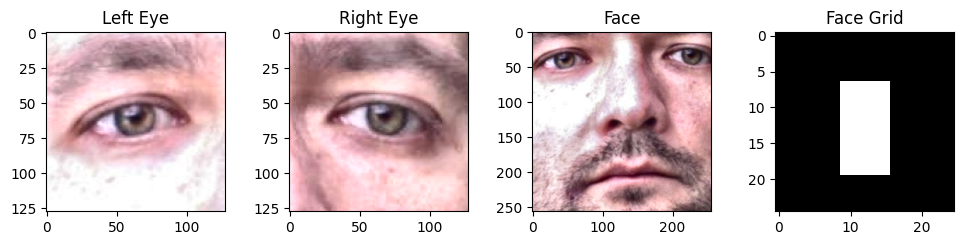

In [25]:
sample = filtered_dataset[-1]
if sample:
    for elem in sample:
        print(f'Shape of {elem}: {sample[elem].shape}')

    fig, axs = plt.subplots(1, 4, figsize=(10, 5))

    # Displaying the left eye image
    axs[0].imshow(np.transpose(sample['left_eye'].numpy(), (1, 2, 0)))
    axs[0].set_title('Left Eye')

    # Displaying the right eye image
    axs[1].imshow(np.transpose(sample['right_eye'].numpy(), (1, 2, 0)))
    axs[1].set_title('Right Eye')

    # Displaying the face image
    axs[2].imshow(np.transpose(sample['face'].numpy(), (1, 2, 0)))
    axs[2].set_title('Face')

    # Displaying the face grid
    axs[3].imshow(sample['face_grid'].numpy(), cmap='gray')
    axs[3].set_title('Face Grid')

    plt.tight_layout(pad=2.0)
    plt.show()

Having completed the dataset preparation, we will now proceed to the model training. This process will be conducted in the same manner as previously.

In [26]:
# Similarly to before we define the train ratio as 0.8
train_size = int(TRAIN_RATIO * len(gaze_dataset))
test_size = len(gaze_dataset) - train_size
filtered_train_dataset, filtered_test_dataset = random_split(filtered_dataset, [train_size, test_size], generator=torch.Generator().manual_seed(SEED))

# Initialize the model and move it to the device
model = CombinedModel().to(device)
print(f"Model initialized on {device}")

Model initialized on cuda:0


Model found and loaded.


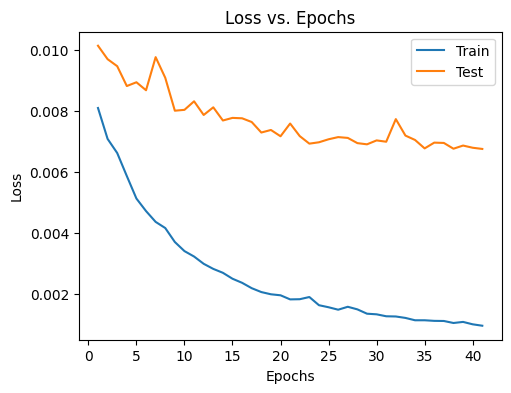

In [27]:
# Initialize loss function and optimizer
criterion = torch.nn.MSELoss()
initial_lr = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=initial_lr)

# Initialize DataLoaders
filtered_train_loader = DataLoader(filtered_train_dataset, batch_size=32, shuffle=True, num_workers=1) #during training set to 2 workers
filtered_test_loader = DataLoader(filtered_test_dataset, batch_size=32, shuffle=False, num_workers=0)

# Load checkpoint
checkpoint_path = "/content/drive/MyDrive/DataSets/filtered_model_checkpoint.pth"
train_losses, test_losses, start_epoch = load_checkpoint(model, optimizer, checkpoint_path)


def train():
  num_epochs = 45
  for epoch in range(start_epoch, num_epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0
    # Step
    for i, data in enumerate(tqdm(filtered_train_loader), 0):
      # Preparing inputs and target
      left_eye = data['left_eye'].to(device)
      right_eye = data['right_eye'].to(device)
      face = data['face'].to(device)
      face_grid = data['face_grid'].to(device)
      coords = data['coords'].to(device)
      # Forward pass
      outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)
      loss = criterion(outputs, coords)

      # Backward and optimize
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item()

    # Calculating average training loss for the epoch
    train_losses.append(running_loss / len(filtered_train_loader))

    # Evaluation step
    model.eval()  # Set the model to evaluation mode
    test_loss = 0.0
    with torch.no_grad():  # Disable gradient computation during evaluation
      for data in tqdm(filtered_test_loader):
        left_eye = data['left_eye'].to(device)
        right_eye = data['right_eye'].to(device)
        face = data['face'].to(device)
        face_grid = data['face_grid'].to(device)
        coords = data['coords'].to(device)

        outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)
        loss = criterion(outputs, coords)
        test_loss += loss.item()

    # Calculating average testing loss for the epoch
    test_losses.append(test_loss / len(filtered_test_loader))

    print(f"Epoch {epoch + 1}, Train Loss: {train_losses[-1]}, Test Loss: {test_losses[-1]}")

    # Save checkpoint
    save_checkpoint(epoch, model, optimizer, train_losses, test_losses, checkpoint_path)

  # Plot losses
  plot_losses(train_losses[5:], test_losses[5:])


# Run the training
train()



We have conducted **45 epochs** of training, mirroring the approach taken with our previous model. It has been observed that the test loss is beginning to plateau. Given the extensive duration required for training, we have decided to stop here.

Next, we will evaluate the effectiveness of this model compared to the previously trained one. To do this, we will compare the loss graphs of both models. It is important to note that our comparison will focus on the final epochs. This decision stems from the fact that in the initial stages of training, both models exhibited significant decreases in loss. Hence, plotting only the later stages allows us to discern the relatively minor differences in loss during the latter part of training more clearly.

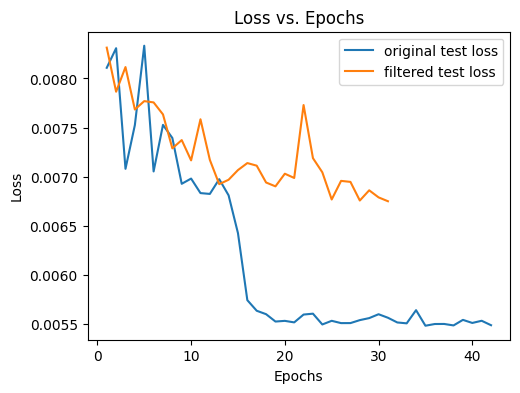

In [28]:
# Load original models checkpoint
original_checkpoint_path = "/content/drive/MyDrive/DataSets/Combined_model_checkpoint5.pth"
original_checkpoint = torch.load(original_checkpoint_path)
original_test_loss = original_checkpoint['test_losses'][15:]

# Load filtered models checkpoint
filtered_checkpoint_path = "/content/drive/MyDrive/DataSets/filtered_model_checkpoint.pth"
filtered_checkpoint = torch.load(filtered_checkpoint_path)
filtered_test_loss = filtered_checkpoint['test_losses'][15:]

# Plot
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(original_test_loss) + 1), original_test_loss, label='original test loss')
plt.plot(range(1, len(filtered_test_loss) + 1), filtered_test_loss, label='filtered test loss')
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


As we can see the application of the filter has yielded worse results compared to those obtained using the original, unfiltered data.

This underperformance may be attributable to various factors, such as the model overfitting to features that are enhanced by the filter yet possess relatively low gaze information. To determine the underlying cause, we will examine the data distribution relative to the model. Specifically, we aim to analyze which types of data each model was better equipped to handle.

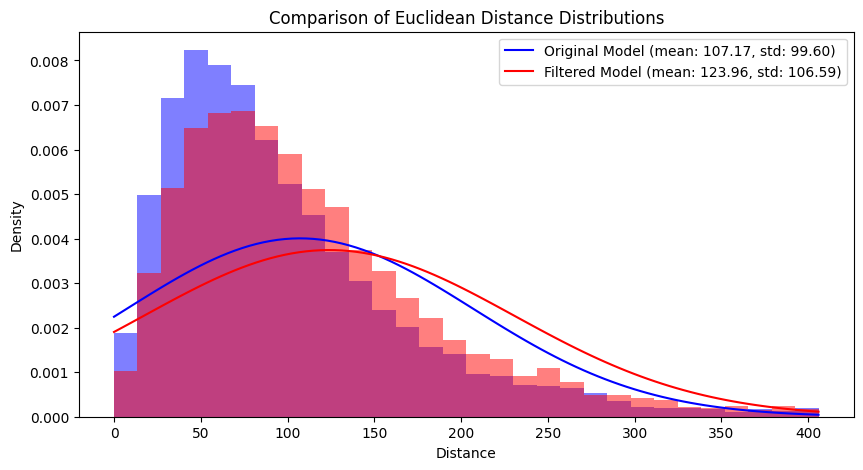

In [29]:
import seaborn as sns
from scipy.stats import norm

# Load models
filtered_model, original_model =  CombinedModel().to(device), CombinedModel().to(device)  # Initialize models

filtered_model.load_state_dict(filtered_checkpoint['model_state_dict'])
original_model.load_state_dict(original_checkpoint['model_state_dict'])


def euclidean_distance_scaled(predictions, true_values, width=1920, height=1080):
  # Scale predictions and true values to screen dimensions
  predictions_scaled = predictions * torch.tensor([width, height]).to(predictions.device)
  true_values_scaled = true_values * torch.tensor([width, height]).to(true_values.device)

  # Calculate Euclidean distance
  return torch.norm(predictions_scaled - true_values_scaled, p=2, dim=1).cpu().numpy()


def calculate_statistics(distances):
    mean = np.mean(distances)
    std = np.std(distances)
    return mean, std

def plot_combined_distribution(distances_1, label_1, color_1, distances_2, label_2, color_2):
  plt.figure(figsize=(10, 5))

  # Calculate statistics
  mean_1, std_1 = calculate_statistics(distances_1)
  mean_2, std_2 = calculate_statistics(distances_2)

  # Determine the upper limit for x-axis
  max_distance = max(max(distances_1), max(distances_2))
  upper_limit = min(max_distance, mean_1 + 3*std_1, mean_2 + 3*std_2)

  # Create histogram and plot normal distribution for the first model
  plt.hist(distances_1, bins=30, range=(0, upper_limit), density=True, alpha=0.5, color=color_1)
  x = np.linspace(0, upper_limit, 100)
  p_1 = norm.pdf(x, mean_1, std_1)
  plt.plot(x, p_1, color=color_1, label=f'{label_1} (mean: {mean_1:.2f}, std: {std_1:.2f})')

  # Create histogram and plot normal distribution for the second model
  plt.hist(distances_2, bins=30, range=(0, upper_limit), density=True, alpha=0.5, color=color_2)
  p_2 = norm.pdf(x, mean_2, std_2)
  plt.plot(x, p_2, color=color_2, label=f'{label_2} (mean: {mean_2:.2f}, std: {std_2:.2f})')

  plt.title("Comparison of Euclidean Distance Distributions")
  plt.xlabel("Distance")
  plt.ylabel("Density")
  plt.legend()
  plt.show()

def find_interesting_samples(distances_1, samples_1, distances_2, samples_2, margin_1, margin_2):
  better_1, better_2, both_good, both_bad = [], [], [], []

  for i in range(len(distances_1)):
    difference = abs(distances_1[i] - distances_2[i])

    if distances_1[i] < distances_2[i] - margin_2:
      better_1.append(samples_1[i])
    elif distances_2[i] < distances_1[i] - margin_1:
      better_2.append(samples_2[i])
    elif distances_1[i] < margin_1 and distances_2[i] < margin_2:
      both_good.append((samples_1[i], samples_2[i]))
    elif distances_1[i] > margin_1 and distances_2[i] > margin_2:
      both_bad.append((samples_1[i], samples_2[i]))

  return better_1, better_2, both_good, both_bad


original_model.eval()
filtered_model.eval()

distances_original, distances_filtered = [], []
samples_original, samples_filtered = [], []


with torch.no_grad():
  for original_data, filtered_data in zip(test_loader, filtered_test_loader):
    # Original model data preparation
    original_left_eye, original_right_eye, original_face, original_face_grid = original_data['left_eye'].to(device), original_data['right_eye'].to(device), original_data['face'].to(device), original_data['face_grid'].to(device)
    original_coords = original_data['coords'].to(device)

    # Filtered model data preparation
    filtered_left_eye, filtered_right_eye, filtered_face, filtered_face_grid = filtered_data['left_eye'].to(device), filtered_data['right_eye'].to(device), filtered_data['face'].to(device), filtered_data['face_grid'].to(device)
    filtered_coords = filtered_data['coords'].to(device)

    # Ensure that labels are identical for corresponding samples in both datasets
    if not torch.equal(original_coords, filtered_coords):
      continue  # Skip this batch if samples do not match

    # Get model outputs
    outputs_original = original_model(original_left_eye, original_right_eye, original_face, original_face_grid)
    outputs_filtered = filtered_model(filtered_left_eye, filtered_right_eye, filtered_face, filtered_face_grid)

    # Calculate distances
    distances_batch_original = euclidean_distance_scaled(outputs_original, original_coords)
    distances_batch_filtered = euclidean_distance_scaled(outputs_filtered, filtered_coords)

    # Extend distances lists
    distances_original.extend(distances_batch_original.tolist())
    distances_filtered.extend(distances_batch_filtered.tolist())

    # Append samples for analysis
    for i in range(len(original_coords)):
      samples_original.append({
        'left_eye': original_data['left_eye'][i],
        'right_eye': original_data['right_eye'][i],
        'face': original_data['face'][i],
        'face_grid': original_data['face_grid'][i],
        'coords': original_data['coords'][i]
      })
      samples_filtered.append({
        'left_eye': filtered_data['left_eye'][i],
        'right_eye': filtered_data['right_eye'][i],
        'face': filtered_data['face'][i],
        'face_grid': filtered_data['face_grid'][i],
        'coords': filtered_data['coords'][i]
      })


# Plotting distributions
plot_combined_distribution(distances_original, "Original Model", 'blue', distances_filtered, "Filtered Model", 'red')


# Setting margins based on standard deviations
margin_original = np.std(distances_original) * 1.5
margin_filtered = np.std(distances_filtered) * 1.5

# Finding interesting samples
better_original, better_filtered, both_good, both_bad = find_interesting_samples(
    distances_original, samples_original, distances_filtered, samples_filtered,
    margin_original, margin_filtered
)



In the graph above, we have conducted some statistical analysis of the training results to gain a deeper understanding of the discrepancy between them.

We observe that the mean accuracy of the original model, measured in Euclidean distance from the true gaze point, is approximately 100 pixels, which translates to about 2.5 cm on the screen. In contrast, this is compared to the filtered model, which has a mean accuracy of around 123 pixels, equating to just over 3 cm. While this may appear to be a negligible difference, in our pursuit of enhancing model accuracy, every millimeter is significant. It is also worth noting that the variance in the filtered model's accuracy is higher, leading to a greater number of outlier samples. This could introduce 'jumpiness' in our ultimate goal of continuous gaze estimation.


---


Next, let's examine the types of samples each model excelled at and seek out samples that are particularly interesting in terms of which model performed better on them. By identifying a common factor among these samples, we might better understand why the application of the filter led to inferior results.

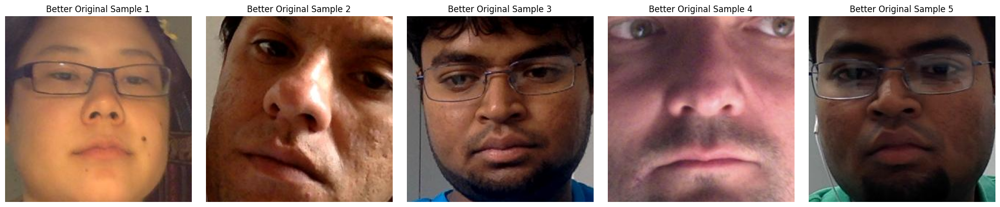

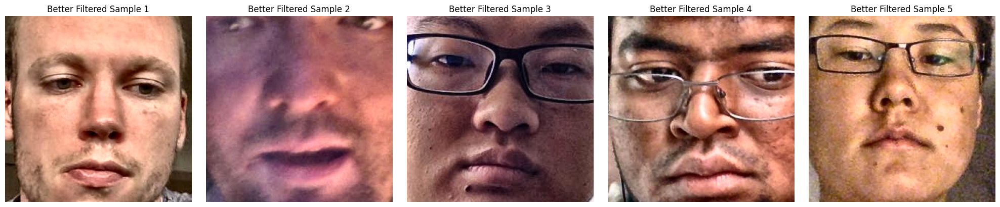

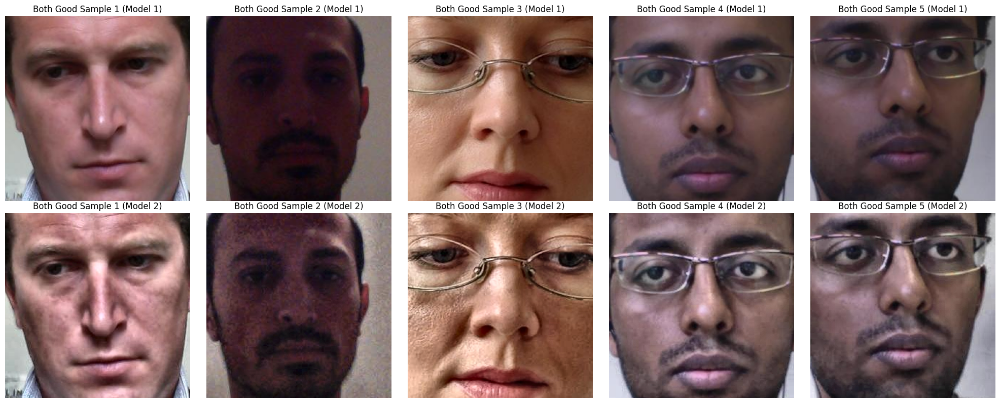

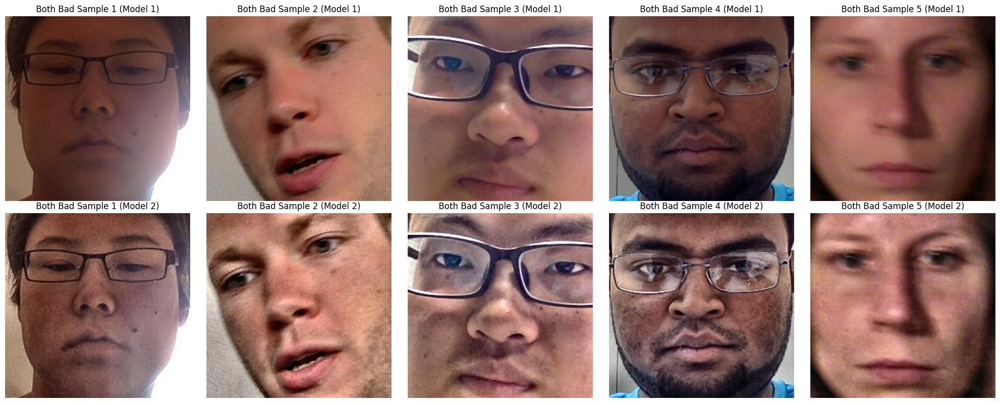

In [30]:
def plot_sample_faces(samples, title, num_samples=5):
  if len(samples) == 0:
    print(f"No samples in '{title}' category.")
    return

  is_tuple = isinstance(samples[0], tuple)
  num_rows = 2 if is_tuple else 1
  fig_width = 4 * num_samples
  fig_height = 4 * num_rows

  plt.figure(figsize=(fig_width, fig_height))

  for i, data in enumerate(samples[:num_samples]):
    if is_tuple:
      face1 = data[0]['face'].cpu().numpy().transpose(1, 2, 0)
      face2 = data[1]['face'].cpu().numpy().transpose(1, 2, 0)

      plt.subplot(num_rows, num_samples, i + 1)
      plt.imshow(face1)
      plt.title(f'{title} Sample {i+1} (Model 1)')
      plt.axis('off')

      plt.subplot(num_rows, num_samples, num_samples + i + 1)
      plt.imshow(face2)
      plt.title(f'{title} Sample {i+1} (Model 2)')
      plt.axis('off')
    else:
      face = data['face'].cpu().numpy().transpose(1, 2, 0)
      plt.subplot(num_rows, num_samples, i + 1)
      plt.imshow(face)
      plt.title(f'{title} Sample {i+1}')
      plt.axis('off')

  plt.tight_layout()  # Adjust layout to prevent overlap
  plt.show()

plot_sample_faces(better_original, "Better Original")
plot_sample_faces(better_filtered, "Better Filtered")
plot_sample_faces(both_good, "Both Good")
plot_sample_faces(both_bad, "Both Bad")


Understanding the nuances of these differences is challenging, especially considering the relatively small variance in mean accuracy. This subtlety makes it difficult to discern any significant patterns that could explain why the use of this specific filter adversely affected the performance score. Bearing this in mind, we recall our initial understanding that excessive preprocessing does not necessarily yield better results. Additionally, given our network's fairly complex architecture, we may be approaching the limits of what preprocessing can beneficially contribute to our model's performance.

Before we continue, let us review the raw numbers as to which model performed better.

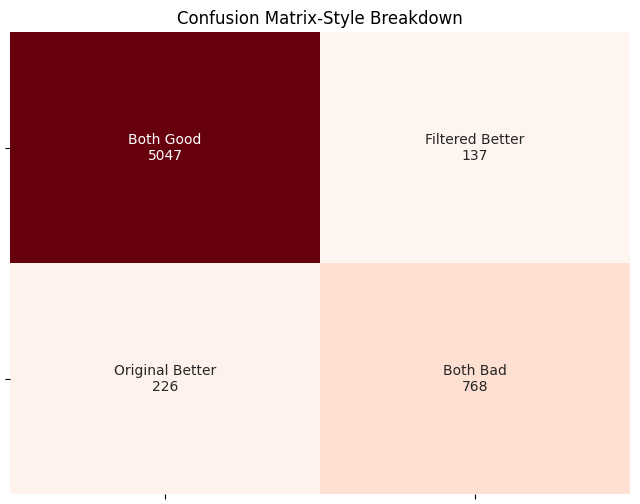

In [31]:
import pandas as pd

def plot_confusion_matrix_style_breakdown(better_original, better_filtered, both_good, both_bad):
  # Prepare data for heatmap
  data = [
    [len(both_good), len(better_filtered)],
    [len(better_original), len(both_bad)]
  ]
  labels = [
    ["Both Good", "Filtered Better"],
    ["Original Better", "Both Bad"]
  ]

  # Combine the counts and labels
  annotations = [[f"{labels[i][j]}\n{data[i][j]}" for j in range(2)] for i in range(2)]

  # Create pandas DataFrames
  data_df = pd.DataFrame(data, index=["", ""], columns=["", ""])
  annot_df = pd.DataFrame(annotations, index=["Both Right", "One Better"], columns=["One Better", "Both Wrong"])

  # Create the heatmap
  plt.figure(figsize=(8, 6))
  sns.heatmap(data_df, annot=annot_df, cmap="Reds", fmt="", cbar=False)

  # Add labels and title
  plt.title("Confusion Matrix-Style Breakdown")

  # Show the plot
  plt.show()

plot_confusion_matrix_style_breakdown(better_original, better_filtered, both_good, both_bad)


Since our previous code was very RAM heavy requiring to run two model simultaniously we will free some of the memory in the next step

In [32]:
import gc

del filtered_model
del original_model
del distances_original, distances_filtered
del samples_original, samples_filtered
del better_original, better_filtered, both_good, both_bad
# Call the garbage collector
gc.collect()

if torch.cuda.is_available():
  torch.cuda.empty_cache()

As observed, the quality difference between the two models is relatively minor when categorizing samples into 'good' or 'bad' classifications. It's crucial to point out that we've defined these 'good' and 'bad' samples based on the standard deviation for each model. This suggests that both models are reasonably adequate for rough estimation purposes. However, the unfiltered model still maintains a position of superiority.


---

our next and final step would have involved attempting the usage of pretrained networks, for the purpose of transfer learning.

The idea here is to take an established well performing vision network, that despite being trained on different data and for a different task, might have been able to learn certain features in images which transcend its purpose. Thus when applied to our gaze dataset the pretrained models approach to the data might introduce a new kind of preprocessing that will be more efficiant in extrcting informating from the raw images.

After carful consideration we have decided to use VGG-16 for its established known performnace, this in theory will save training time and facilitate better feature extracting.

The modification to the network will be fairly minor, where we import the vgg-16 model and disable grad on all its layers thus isolating the training process to only the later layers which will result in more efficiant training.

In [33]:
import torchvision.models as models

class VGG16FeatureExtractor(nn.Module):
  def __init__(self, input_channels=3, num_layers=10):
    super(VGG16FeatureExtractor, self).__init__()
    vgg16 = models.vgg16(pretrained=True)
    self.features = nn.Sequential(*list(vgg16.features.children())[:num_layers])
    for param in self.features.parameters():
      param.requires_grad = False

  def forward(self, x):
    x = self.features(x)
    x = x.view(x.size(0), -1)
    return x

class EyeImageModel(nn.Module):
  def __init__(self):
    super(EyeImageModel, self).__init__()
    self.conv = VGG16FeatureExtractor(input_channels=3, num_layers=10)
    self.fc = nn.Sequential(
      nn.Linear(131072, 128),
      nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = self.conv(x)

    x = self.fc(x)
    return x

class FaceImageModel(nn.Module):
  def __init__(self):
    super(FaceImageModel, self).__init__()
    self.conv = VGG16FeatureExtractor(input_channels=3, num_layers=10)
    self.fc = nn.Sequential(
      nn.Linear(524288, 128),
      nn.ReLU(inplace=True),
      nn.Linear(128, 64),
      nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = self.conv(x)
    x = self.fc(x)
    return x

class FaceGridModel(nn.Module):
  def __init__(self, gridSize=25):
    super(FaceGridModel, self).__init__()
    self.fc = nn.Sequential(
      nn.Linear(gridSize * gridSize, 256),
      nn.ReLU(inplace=True),
      nn.Linear(256, 128),
      nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = x.view(x.size(0), -1)
    x = self.fc(x)
    return x

class TransferLearningModel(nn.Module):
  def __init__(self):
    super(TransferLearningModel, self).__init__()
    self.eyeModel = EyeImageModel()
    self.faceModel = FaceImageModel()
    self.gridModel = FaceGridModel()
    self.eyesFC = nn.Sequential(
      nn.Linear(256, 128),
      nn.ReLU(inplace=True),
    )
    self.fc = nn.Sequential(
      nn.Linear(128 + 64 + 128, 128),
      nn.ReLU(inplace=True),
      nn.Linear(128, 2),
    )

  def forward(self, left_eye, right_eye, face, face_grid):
    EyeL = self.eyeModel(left_eye)
    EyeR = self.eyeModel(right_eye)
    Eyes = torch.cat((EyeL, EyeR), 1)
    Eyes = self.eyesFC(Eyes)
    Face = self.faceModel(face)
    Grid = self.gridModel(face_grid)
    x = torch.cat((Eyes, Face, Grid), 1)
    x = self.fc(x)
    return x

# Using the original unfiltered dataset here
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0)

# Model initialization
model = TransferLearningModel().to(device)
print(f"Model initialized on {device}")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 181MB/s]


Model initialized on cuda:0


Once again we will run the trianing loop with the same parameters

Model found and loaded.


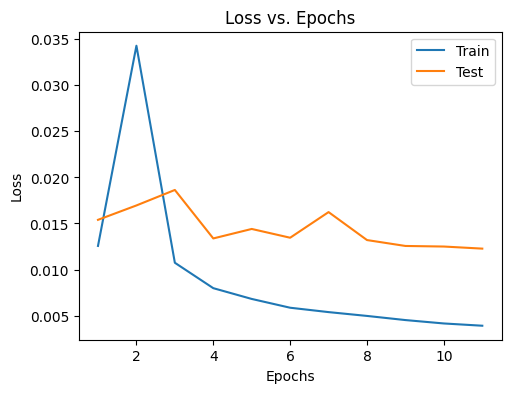

In [34]:
# Initialize loss function and optimizer
criterion = torch.nn.MSELoss()
initial_lr = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=initial_lr)

# Load checkpoint
checkpoint_path = "/content/drive/MyDrive/DataSets/transfer_learning_model_checkpoint.pth"
train_losses, test_losses, start_epoch = load_checkpoint(model, optimizer, checkpoint_path)


def train():
  num_epochs = 16
  for epoch in range(start_epoch, num_epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0
    # Step
    for i, data in enumerate(tqdm(train_loader), 0):
      # Preparing inputs and target
      left_eye = data['left_eye'].to(device)
      right_eye = data['right_eye'].to(device)
      face = data['face'].to(device)
      face_grid = data['face_grid'].to(device)
      coords = data['coords'].to(device)
      # Forward pass
      outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)
      loss = criterion(outputs, coords)

      # Backward and optimize
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item()

    # Calculating average training loss for the epoch
    train_losses.append(running_loss / len(train_loader))

    # Evaluation step
    model.eval()  # Set the model to evaluation mode
    test_loss = 0.0
    with torch.no_grad():  # Disable gradient computation during evaluation
      for data in tqdm(test_loader):
        left_eye = data['left_eye'].to(device)
        right_eye = data['right_eye'].to(device)
        face = data['face'].to(device)
        face_grid = data['face_grid'].to(device)
        coords = data['coords'].to(device)

        outputs = model(left_eye=left_eye, right_eye=right_eye, face=face, face_grid=face_grid)
        loss = criterion(outputs, coords)
        test_loss += loss.item()

    # Calculating average testing loss for the epoch
    test_losses.append(test_loss / len(test_loader))

    print(f"Epoch {epoch + 1}, Train Loss: {train_losses[-1]}, Test Loss: {test_losses[-1]}")

    # Save checkpoint
    save_checkpoint(epoch, model, optimizer, train_losses, test_losses, checkpoint_path)

  # Plot losses
  plot_losses(train_losses[5:], test_losses[5:])

# Run the training
train()

Lets compare this models performance against the original model

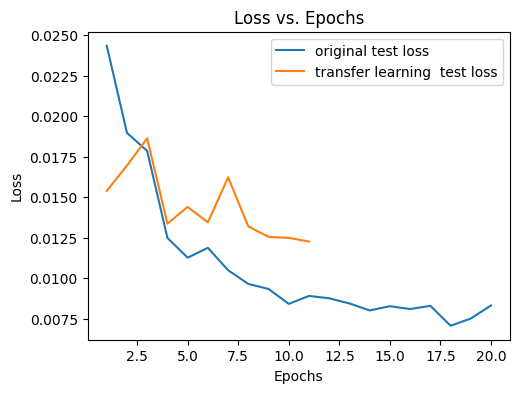

In [37]:
# Load original models checkpoint
original_checkpoint_path = "/content/drive/MyDrive/DataSets/Combined_model_checkpoint5.pth"
original_checkpoint = torch.load(original_checkpoint_path)
original_test_loss = original_checkpoint['test_losses'][:20]

# Load filtered models checkpoint
transfered_checkpoint_path = "/content/drive/MyDrive/DataSets/transfer_learning_model_checkpoint.pth"
transfered_checkpoint = torch.load(transfered_checkpoint_path)
transfered_test_loss = transfered_checkpoint['test_losses'][5:]

# Plot
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(original_test_loss) + 1), original_test_loss, label='original test loss')
plt.plot(range(1, len(transfered_test_loss) + 1), transfered_test_loss, label='transfer learning  test loss')
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


We can observe that the new model built on transfer learning is far underperforming relative to our original model.

Given the information we have previously learned during the model explanation where we found that the models ways of estimating gaze is comparing the relative sizes of the sclera for each of the eyes, it makes sense that this process relays on a very gentle and acccurate representation of the image. Thus using transfer learning from a more crude general model might despite being good for general image classification tasks might lose valuable information in the early processing stage which might hinder our model from further converging on consistant gaze corrolated data

It's also worth noting that, although our network architecture is grounded in established research, we've identified potential pitfalls. Several gaze estimation studies emphasize the sensitivity of the initial convolution layers in models. Given that gaze-correlated features (like the pupil) occupy a relatively small portion of the image, using large kernels or high stride values might lead to significant data loss. While we recognize this issue, our current hardware constraints prevent us from further reducing our models resolution without potentially compromising data quality by also further reducing the data dimensionality.



---



Through our experiments, we have gained several insights. Firstly, adapting the model architecture and its data processing significantly impacts the gaze estimation's accuracy. This finding is encouraging as it suggests the potential for future developments in more robust architectures.

Secondly, our efforts to enhance image quality through various filters yielded marginally different results. Interestingly, the filtered model performed worse in our tests. We surmise that most filters would likely produce similar outcomes, leading to the conclusion that excessive preprocessing does not necessarily translate to improved model performance.

Thirdly, we explored the use of transfer learning with a basic VGG16 architecture. Although transfer learning has proven effective in various domains, it did not yield substantial improvements in our gaze estimation task. We hypothesize that the nuances of gaze-related features in images—often subtle and sensitive areas—require more focused training at the early convolution stages. Pretrained models, while adept at feature extraction, may overlook these critical details, thereby limiting the final model's precision.

Having completed our objectives, we now proceed to the final phase before summarizing our overall experience. This last stage will demonstrate a live application of our model, showcasing its practical capabilities.

For our project, the most effective model was the original one, without the application of filters or transfer learning techniques. Consequently, we will download this model to our device for further use.

The next step involves a brief calibration process. This crucial phase requires the user to focus on a predetermined grid of dots while we capture images of their gaze directed at various points. The collected data will then be used to retrain the fully connected layers of our model, enhancing its adaptability to individual users. Considering the limited participant diversity in our dataset, we cannot presume that the model will generalize effectively across different individuals. Therefore, as previously discussed, this calibration step is important for optimal model performance.

It's noteworthy that once we capture individual features and train the model accordingly, we can save this personalized version. As a result, calibration is only necessary initially or when significant changes in the user's environment occur, such as shifts in lighting or seating position. This approach ensures that the personal calibration step is minimally intrusive for users.

An example of this process will be shown in the following video:

In [38]:
#@title  Run to show video:
from IPython.display import IFrame

IFrame('https://www.youtube.com/embed/oJmh6Rr8MpY', width=640, height=480)


As demonstrated, the model's capability to generalize to subjects not included in the original dataset is currently modest. However, we are optimistic that a more in-depth exploration of calibration strategies, involving meticulous data collection and refined calibration techniques, will further enhance accuracy.  Enhanced calibration processes could provide more personalized and precise gaze estimation, crucial for achieving high accuracy in diverse real-world scenarios.


##**Ideas for Future Improvement**
Throughout this project, we have identified several critical areas where improvements can be made, as well as potential avenues for advancement.

**Enhanced Processing Power**: A significant limitation we encountered was the extensive computational resources required. Both GPU capabilities for training and CPU power for specific data preprocessing were substantial constraints. These limitations not only restricted our ability to experiment creatively but also resulted in considerable delays, as we often had to wait for training to complete before progressing. Therefore, improving access to on-demand GPU resources and faster CPUs could enable finer model tuning and the training of various models with different hyperparameters for benchmarking purposes.

**Refined Feature Extraction:** Our research indicated that only a small portion of the pixels in each image are actually correlated with gaze direction. By focusing on these key areas, such as the eyes, and enhancing their representation in the image, we achieved better results. The hypothesis is that the initial convolutional layers of our model might miss critical gaze-related information due to overly large strides or filter sizes. While hardware limitations restricted our ability to minimize the filter sizes further, a future approach might involve using smaller, more gradual filters in the initial convolutional layers to optimize feature extraction from the source images.

**Exploration of Model Architecture:** The most significant improvements in accuracy were achieved by modifying the model architecture. This suggests that the optimal architecture for this particular problem might still be unexplored. Future work could focus on experimenting with different model architectures to potentially uncover significant improvements in accuracy. This includes using modern and novel techniques such as: RNN, Transformers, and attention mechanism.

**Alternative Calibration Techniques:** Calibration plays a crucial role in improving model accuracy for individual users. Exploring additional calibration methods, beyond the traditional approaches, could offer new ways to enhance the model's performance. These methods might involve more sophisticated data collection techniques, advanced algorithms for processing calibration data, or novel approaches to integrating individual user data into the model training process.

In summary, while the project has yielded promising results, these identified areas present opportunities for further research and development, potentially leading to more efficient and accurate gaze estimation models.

##**Conclusion:**

**Project Overview:** This project embarked on an exploratory journey into the realm of gaze estimation, a cutting-edge area in computer vision and human-computer interaction. Gaze estimation, the process of determining where a person is looking, has applications spanning from accessibility enhancements to user experience improvements in various technologies.

**Exploratory Data Analysis (EDA):** Our initial phase involved an in-depth EDA, where we meticulously analyzed our chosen dataset, MPIIFaceGaze, and explored various approaches for data processing. This dataset, crucial for training our models, provided us with rich insights into gaze patterns through images and corresponding gaze coordinates. As part of the EDA we have also explored the data through the application of different machine learning techniques, such as: clustering, PCA, and Histogram of oriented gradients.

**Naive CNN Implementation:** As a foundational step, we implemented a naive Convolutional Neural Network (CNN) model. This initial model served as a benchmark, affirming the feasibility of using deep learning techniques for gaze estimation.

**Refinement  Approach:** Building upon the naive model, we refined our strategy by incorporating face recognition techniques and a more sophisticated model architecture, partially inspired by existing research in the field. This approach aimed to enhance accuracy by focusing on relevant facial features, particularly around the eyes.

**Network Analysis and Enhancement Attempts:** In our exploration of gaze estimation models, we employed Captum for a deeper analysis of our network, revealing intriguing insights, notably the model's focus on the sclera for gaze prediction. We experimented with image filters, choosing CLAHE for its contrast enhancement potential, but found it underperformed compared to our baseline model. Similarly, incorporating VGG, a robust pre-trained network, did not yield the expected improvements. A comparative analysis of these models highlighted the complex interplay between model architecture, image processing, and training approaches in gaze estimation.

**Performance Comparison and Lessons Learned:** Upon comparing the different models we developed, we gleaned valuable insights. We learned that while pre-processing and sophisticated architectures have their merits, the key to successful gaze estimation lies in a nuanced balance of model complexity, data quality, and processing efficiency.

**Ideas for Future Work:** Finally, we concluded with suggestions for future directions. These included exploring alternative calibration techniques, enhancing processing power, refining feature extraction methods, and experimenting with various model architectures. The goal is to advance the field of gaze estimation, making it more robust, accurate, and applicable in diverse scenarios.

###**Self-Reflection and Gratitude**

Embarking on this project was an exciting journey for me. It was more than just an academic task, thanks to the freedom and flexibility granted to us. This freedom allowed me to delve into my interests and explore computer vision in a way that would resonate with me.

Throughout this project, I encountered a variety of challenges that enriched my learning experience. Navigating through constrained hardware limitations, delving into the complexities of various model architectures and techniques, learning various computer vision algorithms and tools.

This project marked my first really deep dive into computer vision, but its impact went beyond technical learning. I discovered the importance of perseverance, embracing challenges, and the joy of learning from my mistakes.

Im grateful for this journey and for your trust in allowing me to continue with this very specific and odd subject. It has been really an "eye-opening" experience.

Thank you.